### 📥 Importing Required Libraries and Mounting Google Drive

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mlt
import matplotlib.pyplot as plt
import sklearn as skt
import seaborn as sns
import math
import datetime as dt
import random
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore') # to ignore warnings

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### 📊 Loading All Dataset

In [3]:
df_Repeated_Orders= pd.read_csv(r"/content/drive/MyDrive/PROJECT: CUSTOMER RETENTION AND ACQUISITION/Organic Dec_23 Repeated Orders _ May_24.csv")
df_Repeated_Orders.head(2)
# Tip: Add encoding='utf-8' or 'ISO-8859-1' if you face character errors.

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,ADGROUP_NAME,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CREATIVE_NAME,NETWORK,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01T00:43:50.417Z,91,LCV,2.0,DEL,Semi Matured,386.29,...,SME,NaN,NaN,NaN,9319460904,12-2023,12-2023,NaN,NaN,0
1,CRN1439293796,17833089,2023-12-01T00:43:57.228Z,2023-12-01T00:48:04.433Z,9,HCV,3.0,BLR,Matured,1361.28,...,SME,NaN,NaN,NaN,9556041378,12-2023,12-2023,NaN,NaN,0


In [4]:
df_All_Channels_Customers = pd.read_csv(r"/content/drive/MyDrive/PROJECT: CUSTOMER RETENTION AND ACQUISITION/All Channels Customers May_24.csv")
df_All_Channels_Customers.head(2)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,CREATIVE_NAME,NETWORK,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,NaN,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,NaN,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0


In [5]:
df_Customer_Acq= pd.read_csv(r"/content/drive/MyDrive/PROJECT: CUSTOMER RETENTION AND ACQUISITION/Organic Dec_23 Customer Acq.csv")
df_Customer_Acq.head(2)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,CREATIVE_NAME,NETWORK,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,NaN,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,NaN,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0


### ✅ Validating Datasets for Similarity and **Differences**

In [6]:
df_All_Channels_Customers.equals(df_Customer_Acq)

True

In [7]:
(df_All_Channels_Customers == df_Customer_Acq).sum().sum()           # Total number of matching cells
(df_All_Channels_Customers != df_Customer_Acq).sum().sum()

np.int64(945600)

In [8]:
(df_All_Channels_Customers != df_Customer_Acq).sum().sum()

np.int64(945600)

In [9]:
(df_All_Channels_Customers != df_Customer_Acq).sum()

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,2
GEO_REGION_CITY,2
MARKET_TYPE,2
CUSTOMER_FARE,0


In [10]:
(df_All_Channels_Customers == df_Customer_Acq)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,CREATIVE_NAME,NETWORK,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
1,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
2,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
3,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
4,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157656,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
157657,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
157658,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True
157659,True,True,True,True,True,True,True,True,True,True,...,False,False,True,True,True,True,True,True,True,True


In [11]:
print(df_Repeated_Orders.shape)
print(df_All_Channels_Customers.shape)
print(df_Customer_Acq.shape)

(708621, 24)
(157661, 26)
(157661, 26)


In [12]:
print(df_Repeated_Orders.columns)
print(df_All_Channels_Customers.columns)
print(df_Customer_Acq.columns)

Index(['ORDER_ID_RO_IN_WINDOW', 'CUSTOMER_ID', 'REG_DATE_CUSTOMERS',
       'ORDER_DATE', 'VEHICLE_ID', 'VEHICLE_TYPE', 'GEO_REGION_ID',
       'GEO_REGION_CITY', 'MARKET_TYPE', 'CUSTOMER_FARE', 'ADID', 'UUID',
       'REG_DATE', 'FREQ', 'FREQ_SME_RETAILS', 'CAMPAIGN_NAME',
       'CITY_NAME_FROM_CAMPAIGN', 'ADGROUP_NAME', 'MOBILE_NUMBER',
       'REG_MONTH_YEAR', 'ORDER_MONTH_YEAR', 'CREATIVE_NAME', 'NETWORK',
       'CONVERSION_WINDOW'],
      dtype='object')
Index(['ORDER_ID_FO', 'CUSTOMER_ID', 'ADID', 'UUID', 'VEHICLE_ID',
       'VEHICLE_TYPE', 'GEO_REGION_ID', 'GEO_REGION_CITY', 'MARKET_TYPE',
       'CUSTOMER_FARE', 'FREQ', 'FREQ_SME_RETAILS', 'CAMPAIGN_NAME',
       'CITY_NAME_FROM_CAMPAIGN', 'ADGROUP_NAME', 'ADGROUP_FORMATED',
       'CREATIVE_NAME', 'NETWORK', 'MOBILE_NUMBER', 'REG_DATE',
       'REG_DATE_FORMATED', 'ORDER_DATE', 'ORDER_DATE_FORMATED',
       'REG_MONTH_YEAR', 'ORDER_MONTH_YEAR', 'CONVERSION_WINDOW'],
      dtype='object')
Index(['ORDER_ID_FO', 'CUSTOMER_ID',

In [13]:
df_Repeated_Orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708621 entries, 0 to 708620
Data columns (total 24 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ORDER_ID_RO_IN_WINDOW    708621 non-null  object 
 1   CUSTOMER_ID              708621 non-null  int64  
 2   REG_DATE_CUSTOMERS       708621 non-null  object 
 3   ORDER_DATE               708621 non-null  object 
 4   VEHICLE_ID               708621 non-null  int64  
 5   VEHICLE_TYPE             708607 non-null  object 
 6   GEO_REGION_ID            708616 non-null  float64
 7   GEO_REGION_CITY          708621 non-null  object 
 8   MARKET_TYPE              708621 non-null  object 
 9   CUSTOMER_FARE            708621 non-null  float64
 10  ADID                     708621 non-null  object 
 11  UUID                     708621 non-null  object 
 12  REG_DATE                 708621 non-null  object 
 13  FREQ                     708621 non-null  int64  
 14  FREQ

### 🧹 Data Cleaning and Preprocessing

In [14]:
df_Repeated_Orders.isnull().sum()
# sns.heatmap(df_Repeated_Orders.isnull(), cbar=False, yticklabels=False)


,0
ORDER_ID_RO_IN_WINDOW,0
CUSTOMER_ID,0
REG_DATE_CUSTOMERS,0
ORDER_DATE,0
VEHICLE_ID,0
VEHICLE_TYPE,14
GEO_REGION_ID,5
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [15]:
df_Repeated_Orders.drop(['ADGROUP_NAME','CREATIVE_NAME','NETWORK'], axis=1, inplace=True)
df_Repeated_Orders.head(1)

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01T00:43:50.417Z,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0


In [16]:
df_All_Channels_Customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157661 entries, 0 to 157660
Data columns (total 26 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ORDER_ID_FO              157661 non-null  object 
 1   CUSTOMER_ID              157661 non-null  int64  
 2   ADID                     157661 non-null  object 
 3   UUID                     157661 non-null  object 
 4   VEHICLE_ID               157661 non-null  int64  
 5   VEHICLE_TYPE             157661 non-null  object 
 6   GEO_REGION_ID            157659 non-null  float64
 7   GEO_REGION_CITY          157659 non-null  object 
 8   MARKET_TYPE              157659 non-null  object 
 9   CUSTOMER_FARE            157661 non-null  float64
 10  FREQ                     157661 non-null  int64  
 11  FREQ_SME_RETAILS         157661 non-null  object 
 12  CAMPAIGN_NAME            0 non-null       float64
 13  CITY_NAME_FROM_CAMPAIGN  372 non-null     object 
 14  ADGR

In [17]:
df_All_Channels_Customers.drop(['CAMPAIGN_NAME','ADGROUP_NAME','ADGROUP_FORMATED','CREATIVE_NAME','NETWORK'], axis=1, inplace=True)
df_All_Channels_Customers.head(1)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0


In [18]:
df_Customer_Acq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157661 entries, 0 to 157660
Data columns (total 26 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   ORDER_ID_FO              157661 non-null  object 
 1   CUSTOMER_ID              157661 non-null  int64  
 2   ADID                     157661 non-null  object 
 3   UUID                     157661 non-null  object 
 4   VEHICLE_ID               157661 non-null  int64  
 5   VEHICLE_TYPE             157661 non-null  object 
 6   GEO_REGION_ID            157659 non-null  float64
 7   GEO_REGION_CITY          157659 non-null  object 
 8   MARKET_TYPE              157659 non-null  object 
 9   CUSTOMER_FARE            157661 non-null  float64
 10  FREQ                     157661 non-null  int64  
 11  FREQ_SME_RETAILS         157661 non-null  object 
 12  CAMPAIGN_NAME            0 non-null       float64
 13  CITY_NAME_FROM_CAMPAIGN  372 non-null     object 
 14  ADGR

In [19]:
df_Customer_Acq.drop(['CAMPAIGN_NAME','ADGROUP_NAME','ADGROUP_FORMATED','CREATIVE_NAME','NETWORK'], axis=1, inplace=True)
df_Customer_Acq.head(1)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0


In [20]:
print(df_Repeated_Orders.shape)
print(df_All_Channels_Customers.shape)
print(df_Customer_Acq.shape)

(708621, 21)
(157661, 21)
(157661, 21)


In [21]:
# For remove duplicates
# Check unique counts per column
unique_counts = df_Repeated_Orders.nunique()
print(unique_counts)
# 708621

ORDER_ID_RO_IN_WINDOW      708620
CUSTOMER_ID                184833
REG_DATE_CUSTOMERS         184819
ORDER_DATE                 708562
VEHICLE_ID                     43
VEHICLE_TYPE                    3
GEO_REGION_ID                  20
GEO_REGION_CITY                20
MARKET_TYPE                     4
CUSTOMER_FARE              112092
ADID                       184834
UUID                       184833
REG_DATE                   184819
FREQ                            3
FREQ_SME_RETAILS                2
CAMPAIGN_NAME                 190
CITY_NAME_FROM_CAMPAIGN        88
MOBILE_NUMBER              184833
REG_MONTH_YEAR                  3
ORDER_MONTH_YEAR                6
CONVERSION_WINDOW             219
dtype: int64


In [22]:
df_Repeated_Orders_unique = df_Repeated_Orders.drop_duplicates(subset=['ORDER_ID_RO_IN_WINDOW'])
print(df_Repeated_Orders_unique.shape) # Access shape as an attribute
df_Repeated_Orders_unique.head(1)

(708620, 21)


,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01T00:43:50.417Z,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0


In [23]:
df_Repeated_Orders_unique.isnull().sum()

,0
ORDER_ID_RO_IN_WINDOW,0
CUSTOMER_ID,0
REG_DATE_CUSTOMERS,0
ORDER_DATE,0
VEHICLE_ID,0
VEHICLE_TYPE,14
GEO_REGION_ID,5
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [24]:
df_Repeated_Orders_unique['VEHICLE_ID'].dtype

dtype('int64')

In [25]:
df_Repeated_Orders_unique['VEHICLE_TYPE'].dtype

dtype('O')

In [26]:
df_Repeated_Orders_unique['VEHICLE_TYPE'].nunique()

3

In [27]:

df_Repeated_Orders_unique['VEHICLE_TYPE'].unique()

array(['LCV', 'HCV', '2W', nan], dtype=object)

In [28]:
vehicle_mapping = df_Repeated_Orders_unique.dropna(subset=["VEHICLE_TYPE"]).drop_duplicates(subset=["VEHICLE_ID"])[['VEHICLE_ID', 'VEHICLE_TYPE']].set_index('VEHICLE_ID').to_dict()['VEHICLE_TYPE']
print(vehicle_mapping)

{91: 'LCV', 9: 'HCV', 1: 'LCV', 14: 'LCV', 97: '2W', 96: 'LCV', 8: 'HCV', 10: 'HCV', 125: 'LCV', 109: 'HCV', 3: 'HCV', 110: 'HCV', 98: 'LCV', 104: 'LCV', 2: 'HCV', 103: 'LCV', 6: 'LCV', 7: 'LCV', 108: 'HCV', 128: 'HCV', 100: 'HCV', 88: 'LCV', 121: 'LCV', 120: 'HCV', 99: 'LCV', 105: 'LCV', 114: 'HCV', 106: 'HCV', 118: 'HCV', 101: 'LCV', 107: 'HCV', 111: 'HCV', 126: 'LCV', 116: 'HCV', 55: 'LCV', 115: 'HCV', 124: 'LCV', 112: 'HCV', 123: 'LCV', 119: 'HCV', 117: 'HCV'}


In [29]:
df_Repeated_Orders_unique[df_Repeated_Orders_unique['VEHICLE_TYPE'].isna()]


,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
581601,CRN1307010634,17856274,2023-12-02T04:45:36.022Z,2024-04-22T04:37:08.538Z,132,NaN,6.0,AHM,Growth,2189.0,...,58c96c48-901b-4aab-a30c-80c5f5521ad2,2023-12-02T04:45:36.022Z,4,SME,NaN,NaN,9033818281,12-2023,4-2024,142
586577,CRN1524420711,17923476,2023-12-05T10:03:20.771Z,2024-04-23T09:08:40.181Z,132,NaN,6.0,AHM,Growth,1659.0,...,cc904cb7-4ab5-4b1b-b161-f5937b366f07,2023-12-05T10:03:20.771Z,4,SME,NaN,NaN,9376140966,12-2023,4-2024,140
611814,CRN1952018573,17856274,2023-12-02T04:45:36.022Z,2024-05-01T05:44:13.958Z,132,NaN,6.0,AHM,Growth,2192.0,...,58c96c48-901b-4aab-a30c-80c5f5521ad2,2023-12-02T04:45:36.022Z,4,SME,NaN,NaN,9033818281,12-2023,5-2024,151
639192,CRN1476964264,18398811,2023-12-29T07:35:57.702Z,2024-05-09T09:03:57.575Z,133,NaN,8.0,PUN,Growth,84.0,...,30ce95d4-5683-4983-aec5-e2665a569a72,2023-12-29T07:35:57.702Z,5,Retail,NaN,NaN,9518913023,12-2023,5-2024,132
639241,CRN1592525120,18217931,2023-12-20T05:46:15.443Z,2024-05-09T09:09:19.805Z,133,NaN,8.0,PUN,Growth,426.0,...,de33baa3-1969-4e9f-ae77-ae63503c3da5,2023-12-20T05:46:15.443Z,4,SME,NaN,NaN,9860299322,12-2023,5-2024,141
651087,CRN1864681638,18043721,2023-12-11T08:48:49.429Z,2024-05-13T07:16:24.555Z,133,NaN,8.0,PUN,Growth,136.0,...,adc5ac8a-bbc4-444e-bf59-27b513f78af1,2023-12-11T08:48:49.429Z,5,Retail,NaN,NaN,7796767792,12-2023,5-2024,154
656804,CRN1772851919,17948721,2023-12-06T14:17:18.019Z,2024-05-15T04:33:49.397Z,133,NaN,8.0,PUN,Growth,196.0,...,e2eca363-26a5-43e0-b91a-1c483c95d54e,2023-12-06T14:17:18.019Z,5,Retail,NaN,NaN,8530872644,12-2023,5-2024,161
674309,CRN1552976018,17875428,2023-12-02T17:52:16.513Z,2024-05-20T10:17:19.377Z,132,NaN,6.0,AHM,Growth,1605.0,...,b15cd4e2-71a2-4eb3-a014-6db702ea5db5,2023-12-02T17:52:16.513Z,6,Retail,NaN,NaN,8469008218,12-2023,5-2024,170
690387,CRN1302405529,17938440,2023-12-06T07:17:48.398Z,2024-05-25T06:44:08.324Z,133,NaN,8.0,PUN,Growth,186.0,...,0216c5f3-2e14-4666-a35b-843a9de7af9a,2023-12-06T07:17:48.398Z,4,SME,NaN,NaN,9766846977,12-2023,5-2024,171
690952,CRN1151579704,18398811,2023-12-29T07:35:57.702Z,2024-05-25T08:44:35.388Z,133,NaN,8.0,PUN,Growth,219.0,...,30ce95d4-5683-4983-aec5-e2665a569a72,2023-12-29T07:35:57.702Z,5,Retail,NaN,NaN,9518913023,12-2023,5-2024,148


In [30]:
df_Repeated_Orders_unique['VEHICLE_TYPE'].value_counts()


,count
VEHICLE_TYPE,
2W,469049
LCV,207559
HCV,31998


In [31]:
df_Repeated_Orders_unique['VEHICLE_TYPE'] = df_Repeated_Orders_unique['VEHICLE_TYPE'].fillna('2W')

In [32]:
df_Repeated_Orders_unique.isnull().sum()

,0
ORDER_ID_RO_IN_WINDOW,0
CUSTOMER_ID,0
REG_DATE_CUSTOMERS,0
ORDER_DATE,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,5
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [33]:
df_Repeated_Orders_unique[df_Repeated_Orders_unique['GEO_REGION_ID'].isna()]

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
237055,CRN1143317774,18396410,2023-12-29T06:17:30.314Z,2024-01-07T07:23:43.399Z,91,LCV,NaN,IND,Hyper Growth,457.28,...,b7df2496-898e-4671-b1d4-71c3c7439b6c,2023-12-29T06:17:30.314Z,4,SME,NaN,NaN,7869810398,12-2023,1-2024,9
246202,CRN1093936191,18348608,2023-12-26T14:27:58.506Z,2024-01-10T04:30:58.639Z,91,LCV,NaN,CHD,Hyper Growth,135.53,...,1d567456-b6a3-48e4-a8b9-a23b9f338b3d,2023-12-26T14:27:58.506Z,5,Retail,NaN,NaN,9781550038,12-2023,1-2024,15
289975,CRN1703774069,18227407,2023-12-20T11:25:37.361Z,2024-01-23T06:51:40.410Z,97,2W,NaN,SRT,Growth,124.14,...,d70707ca-84d6-471a-8fce-c76b03b84f9e,2023-12-20T11:25:37.361Z,4,SME,NaN,NaN,7021856004,12-2023,1-2024,34
295559,CRN1778000552,18227407,2023-12-20T11:25:37.361Z,2024-01-25T05:34:43.462Z,97,2W,NaN,SRT,Growth,88.45,...,d70707ca-84d6-471a-8fce-c76b03b84f9e,2023-12-20T11:25:37.361Z,4,SME,NaN,NaN,7021856004,12-2023,1-2024,36
471724,CRN1322442508,18396410,2023-12-29T06:17:30.314Z,2024-03-18T10:43:15.312Z,91,LCV,NaN,IND,Hyper Growth,417.38,...,b7df2496-898e-4671-b1d4-71c3c7439b6c,2023-12-29T06:17:30.314Z,4,SME,NaN,NaN,7869810398,12-2023,3-2024,80


In [34]:
vehicle_mapping1 = df_Repeated_Orders_unique.dropna(subset=["GEO_REGION_ID"]).drop_duplicates(subset=["GEO_REGION_CITY"])[['GEO_REGION_CITY', 'GEO_REGION_ID']].set_index('GEO_REGION_CITY').to_dict()['GEO_REGION_ID']
print(vehicle_mapping1)

{'DEL': 2.0, 'BLR': 3.0, 'MUM': 1.0, 'CHN': 5.0, 'HYD': 4.0, 'JPR': 7.0, 'CHD': 15.0, 'KOC': 18.0, 'NGP': 14.0, 'AHM': 6.0, 'LKO': 15.0, 'PUN': 8.0, 'CBE': 12.0, 'KOL': 9.0, 'IND': 13.0, 'SRT': 10.0, 'VDR': 4.0, 'LUD': 2.0, 'NSK': 4.0, 'KNP': 20.0}


In [35]:
vehicle_mapping1

{'DEL': 2.0,
 'BLR': 3.0,
 'MUM': 1.0,
 'CHN': 5.0,
 'HYD': 4.0,
 'JPR': 7.0,
 'CHD': 15.0,
 'KOC': 18.0,
 'NGP': 14.0,
 'AHM': 6.0,
 'LKO': 15.0,
 'PUN': 8.0,
 'CBE': 12.0,
 'KOL': 9.0,
 'IND': 13.0,
 'SRT': 10.0,
 'VDR': 4.0,
 'LUD': 2.0,
 'NSK': 4.0,
 'KNP': 20.0}

In [36]:
df_Repeated_Orders_unique['GEO_REGION_ID'] = df_Repeated_Orders_unique['GEO_REGION_CITY'].map(vehicle_mapping1)
df_Repeated_Orders_unique

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01T00:43:50.417Z,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0
1,CRN1439293796,17833089,2023-12-01T00:43:57.228Z,2023-12-01T00:48:04.433Z,9,HCV,3.0,BLR,Matured,1361.28,...,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0
2,CRN1456514356,17833116,2023-12-01T01:02:22.553Z,2023-12-01T01:05:56.070Z,1,LCV,1.0,MUM,Matured,746.17,...,e2f7b5fa-1e41-4dd7-91fe-67373a17232c,2023-12-01T01:02:22.553Z,5,Retail,NaN,NaN,7039196004,12-2023,12-2023,0
3,CRN1900903855,17833075,2023-12-01T00:34:05.421Z,2023-12-01T01:07:05.982Z,91,LCV,3.0,BLR,Matured,530.42,...,0d91cc38-5e21-4f5c-bc10-2dbb25b9e304,2023-12-01T00:34:05.421Z,5,Retail,NaN,NaN,8261859663,12-2023,12-2023,0
4,CRN1615991541,17833127,2023-12-01T01:07:06.978Z,2023-12-01T01:12:59.590Z,91,LCV,2.0,DEL,Semi Matured,1784.08,...,aba4e525-f73d-4ed2-9f8a-0efd60c76e20,2023-12-01T01:07:06.978Z,5,Retail,NaN,NaN,9999463969,12-2023,12-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708616,CRN1089676304,18194980,2023-12-18T21:46:22.938Z,2024-05-30T20:56:12.775Z,97,2W,2.0,DEL,Semi Matured,407.00,...,a03dbd8f-fae4-4729-bc10-e56ae1ab05b3,2023-12-18T21:46:22.938Z,5,Retail,NaN,NaN,9716507779,12-2023,5-2024,164
708617,CRN1178580600,17852815,2023-12-01T17:11:28.626Z,2024-05-30T21:27:36.280Z,97,2W,5.0,CHN,Semi Matured,196.00,...,7e796963-1a2d-4878-ab84-72bdd71d21d4,2023-12-01T17:11:28.626Z,4,SME,NaN,NaN,7483230245,12-2023,5-2024,181
708618,CRN1783197932,18157374,2023-12-16T18:36:53.552Z,2024-05-30T21:32:19.506Z,91,LCV,7.0,JPR,Hyper Growth,643.00,...,7ce12453-75f0-4be3-9eb0-d7244a57a1de,2023-12-16T18:36:53.552Z,6,Retail,NaN,NaN,7850969219,12-2023,5-2024,166
708619,CRN1671189673,18395755,2023-12-29T05:54:04.834Z,2024-05-30T21:53:47.897Z,1,LCV,4.0,HYD,Semi Matured,695.00,...,c1cdc1ad-74f6-446f-a855-e8bdb79cbd59,2023-12-29T05:54:04.834Z,5,Retail,NaN,NaN,7337237957,12-2023,5-2024,153


In [37]:
df_Repeated_Orders_unique.isnull().sum()
# 708620

,0
ORDER_ID_RO_IN_WINDOW,0
CUSTOMER_ID,0
REG_DATE_CUSTOMERS,0
ORDER_DATE,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,0
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [38]:
df_Repeated_Orders_unique.iloc[237054]

,237055
ORDER_ID_RO_IN_WINDOW,CRN1143317774
CUSTOMER_ID,18396410
REG_DATE_CUSTOMERS,2023-12-29T06:17:30.314Z
ORDER_DATE,2024-01-07T07:23:43.399Z
VEHICLE_ID,91
VEHICLE_TYPE,LCV
GEO_REGION_ID,13.0
GEO_REGION_CITY,IND
MARKET_TYPE,Hyper Growth
CUSTOMER_FARE,457.28


In [39]:
CAMPAIGN_NAME = df_Repeated_Orders_unique[df_Repeated_Orders_unique['CAMPAIGN_NAME'].notna()]
CAMPAIGN_NAME

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
172,CRN1178975468,17834530,2023-12-01T04:05:15.474Z,2023-12-01T04:07:19.580Z,1,LCV,4.0,HYD,Semi Matured,587.94,...,7e2ccc51-4b8a-468c-9b16-08a590e3fdac,2023-12-01T04:05:15.474Z,5,Retail,small transport vehicles app,ansport,8181081118,12-2023,12-2023,0
337,CRN1493982186,17835141,2023-12-01T04:38:05.377Z,2023-12-01T04:50:43.432Z,91,LCV,5.0,CHN,Semi Matured,237.90,...,b05a7a52-5041-4c6c-99aa-e698da5eb31b,2023-12-01T04:38:05.377Z,5,Retail,bike shift app download,ft,9952069824,12-2023,12-2023,0
1247,CRN1736195431,17838607,2023-12-01T06:43:52.757Z,2023-12-01T07:21:17.324Z,91,LCV,1.0,MUM,Matured,413.10,...,8d5ffbe2-1bbe-4f55-b1ee-7132b8e596be,2023-12-01T06:43:52.757Z,4,SME,porter,NaN,8828802115,12-2023,12-2023,0
1385,CRN1182232390,17840200,2023-12-01T07:36:15.757Z,2023-12-01T07:40:55.462Z,97,2W,3.0,BLR,Matured,68.30,...,2bf072bb-4e03-44fa-8a0f-ec703671c2bf,2023-12-01T07:36:15.757Z,5,Retail,for food delivery porter app,NaN,9773817431,12-2023,12-2023,0
1454,CRN2069277738,17840433,2023-12-01T07:44:06.031Z,2023-12-01T07:48:19.380Z,97,2W,3.0,BLR,Matured,151.97,...,4ef8e444-ba8b-4010-acd6-189369cbc9f3,2023-12-01T07:44:06.031Z,5,Retail,porter app,p,8762788158,12-2023,12-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707177,CRN1138794840,18287633,2023-12-23T10:35:12.502Z,2024-05-30T10:24:17.876Z,97,2W,3.0,BLR,Matured,218.00,...,1d2e451e-73cf-4289-8550-2dafaabafe7d,2023-12-23T10:35:12.502Z,5,Retail,porter app,p,9740291584,12-2023,5-2024,159
707402,CRN1559962855,18085632,2023-12-13T09:42:18.828Z,2024-05-30T10:58:29.769Z,91,LCV,2.0,DEL,Semi Matured,0.00,...,b737020f-0849-4096-8e85-f4d9f4249e07,2023-12-13T09:42:18.828Z,4,SME,porter app,p,8527992050,12-2023,5-2024,169
707533,CRN1967785526,18093632,2023-12-13T15:30:14.557Z,2024-05-30T11:24:11.054Z,97,2W,2.0,DEL,Semi Matured,400.00,...,d1c407e0-64d9-4647-b221-e24603cdcb20,2023-12-13T15:30:14.557Z,4,SME,porter app,p,9811324301,12-2023,5-2024,169
708109,CRN1229706526,18201138,2023-12-19T07:19:50.486Z,2024-05-30T13:24:35.010Z,97,2W,8.0,PUN,Growth,116.00,...,96aa7464-e7f4-48c6-b145-bb7ba5207690,2023-12-19T07:19:50.486Z,5,Retail,porter,NaN,7057229944,12-2023,5-2024,163


Drop CITY_NAME_FROM_CAMPAIGN and CAMPAIGN_NAME

In [40]:
df_Repeated_Orders.drop(['CAMPAIGN_NAME','CITY_NAME_FROM_CAMPAIGN'], axis=1, inplace=True)
df_Repeated_Orders.head(1)

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,ADID,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01T00:43:50.417Z,91,LCV,2.0,DEL,Semi Matured,386.29,7b432768223a9bc91aa39d2e0ad752fe,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,9319460904,12-2023,12-2023,0


In [41]:
df_Repeated_Orders_unique.to_csv('df_Repeated_Orders_unique.csv', index=False)

In [42]:
df_Repeated_Orders_unique_saved=pd.read_csv('df_Repeated_Orders_unique.csv')

df_Repeated_Orders_unique_saved **file cleaned**

In [43]:
df_All_Channels_Customers.head(2)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,SME,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0


In [44]:
unique_counts_acc = df_All_Channels_Customers.nunique()
print(unique_counts_acc)
# 157661

ORDER_ID_FO                157660
CUSTOMER_ID                157660
ADID                       157661
UUID                       157660
VEHICLE_ID                     40
VEHICLE_TYPE                    3
GEO_REGION_ID                  20
GEO_REGION_CITY                20
MARKET_TYPE                     4
CUSTOMER_FARE               72837
FREQ                            3
FREQ_SME_RETAILS                2
CITY_NAME_FROM_CAMPAIGN        84
MOBILE_NUMBER              157660
REG_DATE                   157650
REG_DATE_FORMATED              78
ORDER_DATE                 157644
ORDER_DATE_FORMATED           109
REG_MONTH_YEAR                  3
ORDER_MONTH_YEAR                4
CONVERSION_WINDOW              31
dtype: int64


In [45]:
# Identify duplicate rows based on specific columns
duplicates = df_All_Channels_Customers[df_All_Channels_Customers.duplicated(subset=['ADID'])]
duplicates


,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW


In [46]:
df_All_Channels_Customers.isnull().sum()
# 157661

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,2
GEO_REGION_CITY,2
MARKET_TYPE,2
CUSTOMER_FARE,0


In [47]:
df_All_Channels_Customers[df_All_Channels_Customers['GEO_REGION_ID'].isna()]

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
153860,CRN1143317774,18396410,af9cbf57c3975571befff20d9d129a86,b7df2496-898e-4671-b1d4-71c3c7439b6c,91,LCV,NaN,NaN,NaN,457.28,...,SME,NaN,7869810398,2023-12-29T06:17:30.314Z,29-12-2023,2024-01-07T07:23:43.399Z,07-01-2024,12-2023,1-2024,9
154873,CRN1093936191,18348608,c9b9fc45cffe25f707c74c911032514a,1d567456-b6a3-48e4-a8b9-a23b9f338b3d,91,LCV,NaN,NaN,NaN,135.53,...,Retail,NaN,9781550038,2023-12-26T14:27:58.506Z,26-12-2023,2024-01-10T04:30:58.639Z,10-01-2024,12-2023,1-2024,15


In [48]:
df_All_Channels_Customers.drop(index=[153860, 154873], inplace=True)

In [49]:
df_All_Channels_Customers.reset_index(drop=True, inplace=True)

In [50]:
df_All_Channels_Customers

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,SME,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0
2,CRN1333160570,16772155,44c6a471a58b3983b77a04a3e10c3cef,87fb5327-803f-4759-a3d2-5f494a10896a,97,2W,2.0,DEL,Semi Matured,70.29,...,Retail,NaN,8825183732,2023-10-10T13:11:55.181Z,10-10-2023,2023-10-13T16:27:23.095Z,13-10-2023,10-2023,10-2023,3
3,CRN1811055197,16857609,80ab70e4d90303b8e4c9e20432e968c1,5a6d3a2b-488b-4aeb-ab5a-3a6472da3662,1,LCV,9.0,KOL,Hyper Growth,578.93,...,Retail,NaN,6291267571,2023-10-14T18:36:35.086Z,14-10-2023,2023-10-14T18:38:39.110Z,14-10-2023,10-2023,10-2023,0
4,CRN1845847943,16859663,6b023fcb779e97181031edf048a874f1,3783abf3-ae0a-45fd-bb28-22c189091b0d,97,2W,3.0,BLR,Matured,193.52,...,Retail,NaN,8618684804,2023-10-15T03:54:10.192Z,15-10-2023,2023-10-15T03:58:07.684Z,15-10-2023,10-2023,10-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157654,CRN1912544765,18443599,96756d7e26f69ee519585b440d00641f,21ff97d0-ead3-420b-a98e-cf2fafbb2722,97,2W,2.0,DEL,Semi Matured,60.90,...,Retail,NaN,8839750533,2023-12-31T09:07:24.663Z,31-12-2023,2024-01-30T10:05:31.243Z,30-01-2024,12-2023,1-2024,30
157655,CRN2047526730,18441498,ed97f8b9fbaa51f3b49bfcefb2b7baf9,fcdbe255-8c91-4031-9749-ddf5f7550444,97,2W,10.0,SRT,Growth,145.54,...,SME,NaN,9664609138,2023-12-31T07:44:51.967Z,31-12-2023,2024-01-30T13:16:32.900Z,30-01-2024,12-2023,1-2024,30
157656,CRN1130917095,18436754,22b5cceeca1df197cfc7355f3a035440,4216a809-6aa7-4378-8790-97886f07d2f1,1,LCV,3.0,BLR,Matured,496.26,...,Retail,NaN,8093009449,2023-12-31T04:39:08.820Z,31-12-2023,2024-01-30T14:04:09.124Z,30-01-2024,12-2023,1-2024,30
157657,CRN1833050727,18437113,1730ad8f903f61a387722bebbecd6165,86edaf5d-ff19-4530-9300-2463a0ddb8b1,97,2W,3.0,BLR,Matured,81.00,...,Retail,NaN,9902584276,2023-12-31T04:58:12.007Z,31-12-2023,2024-01-30T16:21:25.453Z,30-01-2024,12-2023,1-2024,30


In [51]:
df_All_Channels_Customers.isnull().sum()

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,0
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


Drop CITY_NAME_FROM_CAMPAIGN

In [52]:
df_All_Channels_Customers.drop(['CITY_NAME_FROM_CAMPAIGN'], axis=1, inplace=True)
df_All_Channels_Customers.isnull().sum()

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,0
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [53]:
df_All_Channels_Customers.to_csv('df_All_Channels_Customers.csv', index=False)

saved

In [54]:
df_All_Channels_Customers_saved=pd.read_csv('df_All_Channels_Customers.csv')

In [55]:
df_Customer_Acq.head(2)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,SME,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0


In [56]:
unique_counts_ca = df_Customer_Acq.nunique()
print(unique_counts_ca)
# 157661

ORDER_ID_FO                157660
CUSTOMER_ID                157660
ADID                       157661
UUID                       157660
VEHICLE_ID                     40
VEHICLE_TYPE                    3
GEO_REGION_ID                  20
GEO_REGION_CITY                20
MARKET_TYPE                     4
CUSTOMER_FARE               72837
FREQ                            3
FREQ_SME_RETAILS                2
CITY_NAME_FROM_CAMPAIGN        84
MOBILE_NUMBER              157660
REG_DATE                   157650
REG_DATE_FORMATED              78
ORDER_DATE                 157644
ORDER_DATE_FORMATED           109
REG_MONTH_YEAR                  3
ORDER_MONTH_YEAR                4
CONVERSION_WINDOW              31
dtype: int64


In [57]:
# Identify duplicate rows based on specific columns
duplicates = df_Customer_Acq[df_Customer_Acq.duplicated(subset=['ADID'])]
duplicates

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW


In [58]:
df_Customer_Acq.isnull().sum()
# 157661

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,2
GEO_REGION_CITY,2
MARKET_TYPE,2
CUSTOMER_FARE,0


In [59]:
df_Customer_Acq[df_Customer_Acq['GEO_REGION_ID'].isna()]

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
153860,CRN1143317774,18396410,af9cbf57c3975571befff20d9d129a86,b7df2496-898e-4671-b1d4-71c3c7439b6c,91,LCV,NaN,NaN,NaN,457.28,...,SME,NaN,7869810398,2023-12-29T06:17:30.314Z,29-12-2023,2024-01-07T07:23:43.399Z,07-01-2024,12-2023,1-2024,9
154873,CRN1093936191,18348608,c9b9fc45cffe25f707c74c911032514a,1d567456-b6a3-48e4-a8b9-a23b9f338b3d,91,LCV,NaN,NaN,NaN,135.53,...,Retail,NaN,9781550038,2023-12-26T14:27:58.506Z,26-12-2023,2024-01-10T04:30:58.639Z,10-01-2024,12-2023,1-2024,15


In [60]:
df_Customer_Acq.drop(index=[153860, 154873], inplace=True)

In [61]:
df_Customer_Acq.reset_index(drop=True, inplace=True)

In [62]:
df_Customer_Acq

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,FREQ_SME_RETAILS,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,...,Retail,NaN,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,...,SME,NaN,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0
2,CRN1333160570,16772155,44c6a471a58b3983b77a04a3e10c3cef,87fb5327-803f-4759-a3d2-5f494a10896a,97,2W,2.0,DEL,Semi Matured,70.29,...,Retail,NaN,8825183732,2023-10-10T13:11:55.181Z,10-10-2023,2023-10-13T16:27:23.095Z,13-10-2023,10-2023,10-2023,3
3,CRN1811055197,16857609,80ab70e4d90303b8e4c9e20432e968c1,5a6d3a2b-488b-4aeb-ab5a-3a6472da3662,1,LCV,9.0,KOL,Hyper Growth,578.93,...,Retail,NaN,6291267571,2023-10-14T18:36:35.086Z,14-10-2023,2023-10-14T18:38:39.110Z,14-10-2023,10-2023,10-2023,0
4,CRN1845847943,16859663,6b023fcb779e97181031edf048a874f1,3783abf3-ae0a-45fd-bb28-22c189091b0d,97,2W,3.0,BLR,Matured,193.52,...,Retail,NaN,8618684804,2023-10-15T03:54:10.192Z,15-10-2023,2023-10-15T03:58:07.684Z,15-10-2023,10-2023,10-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157654,CRN1912544765,18443599,96756d7e26f69ee519585b440d00641f,21ff97d0-ead3-420b-a98e-cf2fafbb2722,97,2W,2.0,DEL,Semi Matured,60.90,...,Retail,NaN,8839750533,2023-12-31T09:07:24.663Z,31-12-2023,2024-01-30T10:05:31.243Z,30-01-2024,12-2023,1-2024,30
157655,CRN2047526730,18441498,ed97f8b9fbaa51f3b49bfcefb2b7baf9,fcdbe255-8c91-4031-9749-ddf5f7550444,97,2W,10.0,SRT,Growth,145.54,...,SME,NaN,9664609138,2023-12-31T07:44:51.967Z,31-12-2023,2024-01-30T13:16:32.900Z,30-01-2024,12-2023,1-2024,30
157656,CRN1130917095,18436754,22b5cceeca1df197cfc7355f3a035440,4216a809-6aa7-4378-8790-97886f07d2f1,1,LCV,3.0,BLR,Matured,496.26,...,Retail,NaN,8093009449,2023-12-31T04:39:08.820Z,31-12-2023,2024-01-30T14:04:09.124Z,30-01-2024,12-2023,1-2024,30
157657,CRN1833050727,18437113,1730ad8f903f61a387722bebbecd6165,86edaf5d-ff19-4530-9300-2463a0ddb8b1,97,2W,3.0,BLR,Matured,81.00,...,Retail,NaN,9902584276,2023-12-31T04:58:12.007Z,31-12-2023,2024-01-30T16:21:25.453Z,30-01-2024,12-2023,1-2024,30


In [63]:
df_Customer_Acq.isnull().sum()

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,0
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


Drop CITY_NAME_FROM_CAMPAIGN

In [64]:
df_Customer_Acq.drop(['CITY_NAME_FROM_CAMPAIGN'], axis=1, inplace=True)
df_Customer_Acq.isnull().sum()

,0
ORDER_ID_FO,0
CUSTOMER_ID,0
ADID,0
UUID,0
VEHICLE_ID,0
VEHICLE_TYPE,0
GEO_REGION_ID,0
GEO_REGION_CITY,0
MARKET_TYPE,0
CUSTOMER_FARE,0


In [65]:
df_Customer_Acq.to_csv('df_Customer_Acq.csv', index=False)

Saved

In [66]:
df_Customer_Acq=pd.read_csv('df_Customer_Acq.csv')

### 🧮 RFM Analysis for Customer Segmentation

**Calculate Key Metrics**

Create a summary DataFrame with the following metrics for each customer:

Recency: Days since the customer's last purchase.

Frequency: Total number of purchases made by the customer.

Monetary Value (Order Value): Total or average amount spent by the customer.

In [67]:
from datetime import datetime, timezone
import pandas as pd

# Current date for recency calculation
current_date = datetime.now(timezone.utc)  # Get current date with UTC timezone

# Convert 'ORDER_DATE' to datetime objects before calculating recency
df_Repeated_Orders_unique_saved['ORDER_DATE'] = pd.to_datetime(df_Repeated_Orders_unique_saved['ORDER_DATE'])

# Ensure 'ORDER_DATE' is timezone-aware (if not already) and convert to UTC
df_Repeated_Orders_unique_saved['ORDER_DATE'] = df_Repeated_Orders_unique_saved['ORDER_DATE'].dt.tz_localize(None).dt.tz_localize('UTC')


# Calculate Recency
recency = df_Repeated_Orders_unique_saved.groupby('CUSTOMER_ID')['ORDER_DATE'].max().apply(lambda x: (current_date - x).days)

# Calculate Frequency
frequency = df_Repeated_Orders_unique_saved.groupby('CUSTOMER_ID')['ORDER_DATE'].count()

# Calculate Monetary Value using 'CUSTOMER_FARE'
monetary = df_Repeated_Orders_unique_saved.groupby('CUSTOMER_ID')['CUSTOMER_FARE'].sum()

# Combine into a single DataFrame
rfm = pd.DataFrame({
    'Recency': recency,
    'Frequency': frequency,
    'MonetaryValue': monetary
})

rfm

,Recency,Frequency,MonetaryValue
CUSTOMER_ID,,,
16772155,540,1,104.92
16785502,365,5,1822.00
16803571,375,5,1260.07
16815351,539,1,235.87
16843891,371,7,910.73
...,...,...,...
18453188,451,4,1572.41
18453195,513,1,904.70
18453221,513,1,362.03


In [68]:
# Handle Recency, Frequency, and Monetary Value scoring
rfm['Recency_Score'] = pd.qcut(rfm['Recency'], 4, labels=[4, 3, 2, 1])  # Lower Recency is better

# Use pd.cut for Frequency if duplicate bin edges are an issue
max_frequency = rfm['Frequency'].max()
rfm['Frequency_Score'] = pd.cut(
    rfm['Frequency'],
    bins=[0, 1, 3, 5, max_frequency],  # Define bins
    labels=[1, 2, 3, 4],               # Higher Frequency is better
    include_lowest=True
)

# Use pd.qcut for MonetaryValue as it often has sufficient variation
rfm['Monetary_Score'] = pd.qcut(rfm['MonetaryValue'], 4, labels=[1, 2, 3, 4])  # Higher Monetary is better

# Combine scores into an RFM Score
rfm['RFM_Score'] = rfm['Recency_Score'].astype(int) + rfm['Frequency_Score'].astype(int) + rfm['Monetary_Score'].astype(int)

# Output the result
rfm

,Recency,Frequency,MonetaryValue,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score
CUSTOMER_ID,,,,,,,
16772155,540,1,104.92,1,1,1,3
16785502,365,5,1822.00,4,3,4,11
16803571,375,5,1260.07,4,3,4,11
16815351,539,1,235.87,1,1,2,4
16843891,371,7,910.73,4,4,3,11
...,...,...,...,...,...,...,...
18453188,451,4,1572.41,3,3,4,10
18453195,513,1,904.70,3,1,3,7
18453221,513,1,362.03,3,1,2,6


In [69]:
def segment_customer(row):
    if row['RFM_Score'] >= 10:
        return 'Champion'
    elif row['RFM_Score'] >= 7:
        return 'Loyal Customer'
    elif row['RFM_Score'] >= 5:
        return 'Potential Loyalist'
    else:
        return 'At Risk'

rfm['Segment'] = rfm.apply(segment_customer, axis=1)
rfm

,Recency,Frequency,MonetaryValue,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
CUSTOMER_ID,,,,,,,,
16772155,540,1,104.92,1,1,1,3,At Risk
16785502,365,5,1822.00,4,3,4,11,Champion
16803571,375,5,1260.07,4,3,4,11,Champion
16815351,539,1,235.87,1,1,2,4,At Risk
16843891,371,7,910.73,4,4,3,11,Champion
...,...,...,...,...,...,...,...,...
18453188,451,4,1572.41,3,3,4,10,Champion
18453195,513,1,904.70,3,1,3,7,Loyal Customer
18453221,513,1,362.03,3,1,2,6,Potential Loyalist


In [70]:
segment_counts = rfm['Segment'].value_counts()
print(segment_counts)

Segment
Potential Loyalist    55033
Loyal Customer        49614
At Risk               44373
Champion              35813
Name: count, dtype: int64


In [71]:
rfm.reset_index(drop=False, inplace=True)
rfm

,CUSTOMER_ID,Recency,Frequency,MonetaryValue,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
0,16772155,540,1,104.92,1,1,1,3,At Risk
1,16785502,365,5,1822.00,4,3,4,11,Champion
2,16803571,375,5,1260.07,4,3,4,11,Champion
3,16815351,539,1,235.87,1,1,2,4,At Risk
4,16843891,371,7,910.73,4,4,3,11,Champion
...,...,...,...,...,...,...,...,...,...
184828,18453188,451,4,1572.41,3,3,4,10,Champion
184829,18453195,513,1,904.70,3,1,3,7,Loyal Customer
184830,18453221,513,1,362.03,3,1,2,6,Potential Loyalist
184831,18453223,423,4,2712.29,3,3,4,10,Champion


In [72]:
rfm.to_csv('rfm.csv', index=False)

In [73]:
# Filter rows where Segment is 'Champion'
champion_ids = rfm[rfm['Segment'] == 'Champion']['CUSTOMER_ID']

# Print all IDs of Champions
champion_ids

,CUSTOMER_ID
1,16785502
2,16803571
4,16843891
5,16852865
14,16911220
...,...
184804,18453072
184814,18453117
184826,18453183
184828,18453188


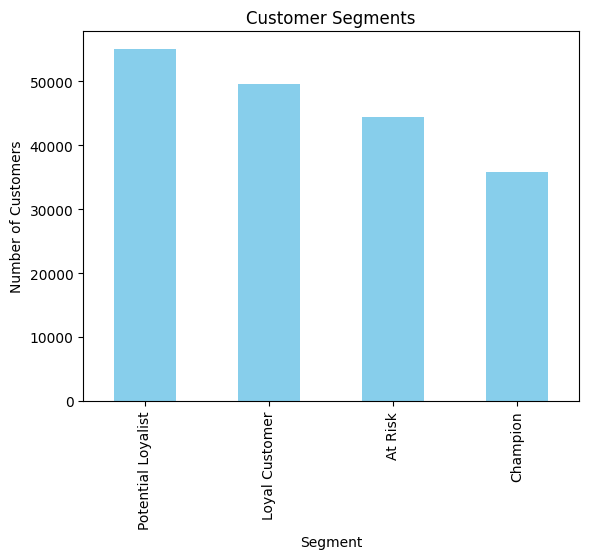

In [74]:
import matplotlib.pyplot as plt

segment_counts.plot(kind='bar', color='skyblue', title='Customer Segments')
plt.xlabel('Segment')
plt.ylabel('Number of Customers')
plt.show()


In [75]:
rfm

,CUSTOMER_ID,Recency,Frequency,MonetaryValue,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
0,16772155,540,1,104.92,1,1,1,3,At Risk
1,16785502,365,5,1822.00,4,3,4,11,Champion
2,16803571,375,5,1260.07,4,3,4,11,Champion
3,16815351,539,1,235.87,1,1,2,4,At Risk
4,16843891,371,7,910.73,4,4,3,11,Champion
...,...,...,...,...,...,...,...,...,...
184828,18453188,451,4,1572.41,3,3,4,10,Champion
184829,18453195,513,1,904.70,3,1,3,7,Loyal Customer
184830,18453221,513,1,362.03,3,1,2,6,Potential Loyalist
184831,18453223,423,4,2712.29,3,3,4,10,Champion


### 🔍 Behavioral Segmentation

In [76]:
# df_Repeated_Orders
df_Repeated_Orders_unique_saved.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708620 entries, 0 to 708619
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   ORDER_ID_RO_IN_WINDOW    708620 non-null  object             
 1   CUSTOMER_ID              708620 non-null  int64              
 2   REG_DATE_CUSTOMERS       708620 non-null  object             
 3   ORDER_DATE               708620 non-null  datetime64[ns, UTC]
 4   VEHICLE_ID               708620 non-null  int64              
 5   VEHICLE_TYPE             708620 non-null  object             
 6   GEO_REGION_ID            708620 non-null  float64            
 7   GEO_REGION_CITY          708620 non-null  object             
 8   MARKET_TYPE              708620 non-null  object             
 9   CUSTOMER_FARE            708620 non-null  float64            
 10  ADID                     708620 non-null  object             
 11  UUID         

In [77]:
df_Repeated_Orders_unique_saved.head(10)

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01T00:32:14.792Z,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0
1,CRN1439293796,17833089,2023-12-01T00:43:57.228Z,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0
2,CRN1456514356,17833116,2023-12-01T01:02:22.553Z,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,...,e2f7b5fa-1e41-4dd7-91fe-67373a17232c,2023-12-01T01:02:22.553Z,5,Retail,NaN,NaN,7039196004,12-2023,12-2023,0
3,CRN1900903855,17833075,2023-12-01T00:34:05.421Z,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,...,0d91cc38-5e21-4f5c-bc10-2dbb25b9e304,2023-12-01T00:34:05.421Z,5,Retail,NaN,NaN,8261859663,12-2023,12-2023,0
4,CRN1615991541,17833127,2023-12-01T01:07:06.978Z,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,...,aba4e525-f73d-4ed2-9f8a-0efd60c76e20,2023-12-01T01:07:06.978Z,5,Retail,NaN,NaN,9999463969,12-2023,12-2023,0
5,CRN2105568127,17833149,2023-12-01T01:18:35.101Z,2023-12-01 01:23:03.727000+00:00,91,LCV,3.0,BLR,Matured,597.74,...,79bfb525-311d-45de-90f9-669fbee68529,2023-12-01T01:18:35.101Z,5,Retail,NaN,NaN,7795313053,12-2023,12-2023,0
6,CRN1693867471,17833144,2023-12-01T01:15:32.514Z,2023-12-01 01:24:11.993000+00:00,14,LCV,5.0,CHN,Semi Matured,708.81,...,2f770640-963b-4725-8a0e-caec5fc03f45,2023-12-01T01:15:32.514Z,4,SME,NaN,NaN,9176987875,12-2023,12-2023,0
7,CRN1093365763,17833166,2023-12-01T01:24:54.686Z,2023-12-01 01:28:32.864000+00:00,97,2W,3.0,BLR,Matured,0.00,...,30b98df0-d7c4-430c-ba5c-5a1bf967f96f,2023-12-01T01:24:54.686Z,5,Retail,NaN,NaN,9986287735,12-2023,12-2023,0
8,CRN1465207187,17833180,2023-12-01T01:29:07.594Z,2023-12-01 01:31:59.490000+00:00,97,2W,3.0,BLR,Matured,45.56,...,37dacf0d-9a28-4c0c-8149-8d95e1449ff2,2023-12-01T01:29:07.594Z,6,Retail,NaN,NaN,9900787801,12-2023,12-2023,0
9,CRN2061756481,17833196,2023-12-01T01:34:16.115Z,2023-12-01 01:36:47.534000+00:00,97,2W,3.0,BLR,Matured,150.32,...,e53a39f2-d966-4721-9012-e04be63520fc,2023-12-01T01:34:16.115Z,5,Retail,NaN,NaN,9164471235,12-2023,12-2023,0


FOR CUSTOMER ID AND SME/RETAIL

In [78]:
# Filter rows where Freq == 4 and calculate the total CUSTOMER_FARE
total_customer_fare = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ'] == 4]['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for Freq = 4:", total_customer_fare)

Total CUSTOMER_FARE for Freq = 4: 119016983.46999998


In [79]:
total_customer_fare = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ'] == 5]['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for Freq = 5:", total_customer_fare)

Total CUSTOMER_FARE for Freq = 5: 101818927.09


In [80]:
total_customer_fare = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ'] == 6]['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for Freq = 6:", total_customer_fare)

Total CUSTOMER_FARE for Freq = 6: 15299622.950000001


In [81]:
# Filter rows where Freq is 4 or 5, then calculate the total CUSTOMER_FARE
total_customer_fare = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ'].isin([5, 6])]['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for Freq = 6 and Freq = 5:", total_customer_fare)


Total CUSTOMER_FARE for Freq = 6 and Freq = 5: 117118550.04


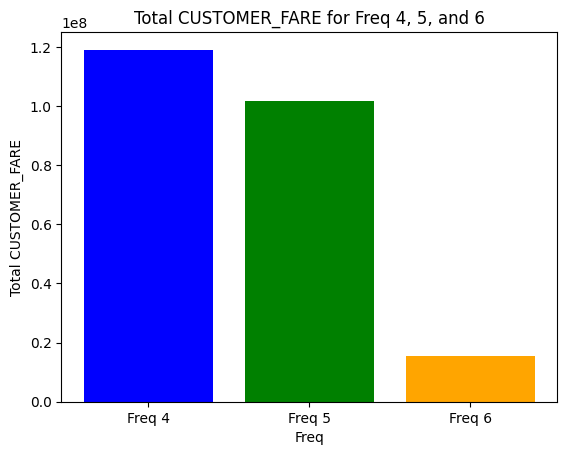

In [82]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter the DataFrame to include only Freq = 4, 5, and 6
filtered_df = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ'].isin([4, 5, 6])]

# Group data by Freq and calculate the total CUSTOMER_FARE
total_fare_by_freq = filtered_df.groupby('FREQ')['CUSTOMER_FARE'].sum()

# Plotting the bar graph
plt.bar(total_fare_by_freq.index, total_fare_by_freq.values, color=['blue', 'green', 'orange'], tick_label=['Freq 4', 'Freq 5', 'Freq 6'])

# Adding labels and title
plt.xlabel('Freq')
plt.ylabel('Total CUSTOMER_FARE')
plt.title('Total CUSTOMER_FARE for Freq 4, 5, and 6')

# Display the plot
plt.show()


### 🧮 Customer Lifetime Value (CLV) Analysis

In [83]:
# Convert dates to datetime format
df_Repeated_Orders_unique_saved['REG_DATE_CUSTOMERS'] = pd.to_datetime(df_Repeated_Orders_unique_saved['REG_DATE_CUSTOMERS'])
df_Repeated_Orders_unique_saved['ORDER_DATE'] = pd.to_datetime(df_Repeated_Orders_unique_saved['ORDER_DATE'])


In [84]:
# Group by CUSTOMER_ID to calculate key metrics
customer_metrics = df_Repeated_Orders_unique_saved.groupby('CUSTOMER_ID').agg(
    total_revenue=('CUSTOMER_FARE', 'sum'),
    order_count=('ORDER_ID_RO_IN_WINDOW', 'count'),
    first_order_date=('ORDER_DATE', 'min'),
    last_order_date=('ORDER_DATE', 'max'),
    reg_date=('REG_DATE_CUSTOMERS', 'min')
).reset_index()
customer_metrics

,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date
0,16772155,104.92,1,2023-12-04 16:31:40.184000+00:00,2023-12-04 16:31:40.184000+00:00,2023-10-10 13:11:55.181000+00:00
1,16785502,1822.00,5,2023-12-08 08:41:05.948000+00:00,2024-05-27 14:22:07.309000+00:00,2023-10-11 08:51:44.805000+00:00
2,16803571,1260.07,5,2024-01-24 06:47:41.193000+00:00,2024-05-18 08:08:20.328000+00:00,2023-10-12 07:54:14.682000+00:00
3,16815351,235.87,1,2023-12-06 08:19:23.538000+00:00,2023-12-06 08:19:23.538000+00:00,2023-10-12 17:22:19.786000+00:00
4,16843891,910.73,7,2023-12-22 04:25:48.629000+00:00,2024-05-22 09:15:09.177000+00:00,2023-10-14 07:33:56.417000+00:00
...,...,...,...,...,...,...
184828,18453188,1572.41,4,2024-02-21 11:43:08.798000+00:00,2024-03-02 17:37:45.139000+00:00,2023-12-31 22:57:27.039000+00:00
184829,18453195,904.70,1,2023-12-31 23:19:10.929000+00:00,2023-12-31 23:19:10.929000+00:00,2023-12-31 23:04:54.055000+00:00
184830,18453221,362.03,1,2023-12-31 23:50:41.510000+00:00,2023-12-31 23:50:41.510000+00:00,2023-12-31 23:48:56.728000+00:00
184831,18453223,2712.29,4,2024-01-01 00:00:20.951000+00:00,2024-03-31 10:03:36.863000+00:00,2023-12-31 23:50:26.050000+00:00


In [85]:
# Group by CUSTOMER_ID to calculate key metrics
customer_metrics = df_Repeated_Orders_unique_saved.groupby('CUSTOMER_ID').agg(
    total_revenue=('CUSTOMER_FARE', 'sum'),
    order_count=('ORDER_ID_RO_IN_WINDOW', 'count'),
    first_order_date=('ORDER_DATE', 'min'),
    last_order_date=('ORDER_DATE', 'max'),
    reg_date=('REG_DATE_CUSTOMERS', 'min')
).reset_index()
customer_metrics

# Calculate customer lifespan in months
customer_metrics['customer_lifespan_months'] = (
    (customer_metrics['last_order_date'] - customer_metrics['first_order_date']).dt.days / 30
).round()

# Avoid division by zero for avg_monthly_revenue
customer_metrics['avg_monthly_revenue'] = (
    customer_metrics['total_revenue'] / customer_metrics['customer_lifespan_months']
).where(customer_metrics['customer_lifespan_months'] > 0, 0)

# Calculate Historical CLV (set to 0 if lifespan is 0)
customer_metrics['Historical_clv/Predictive_clv'] = customer_metrics['avg_monthly_revenue'] * customer_metrics['customer_lifespan_months']

customer_metrics['clv_segment'] = pd.qcut(
    customer_metrics['Historical_clv/Predictive_clv'],
    q=3,  # Reduce number of bins
    labels=['Low', 'Medium', 'High'],
    duplicates='drop'
)
bins = [0, 1, 1000, 2000, 50000, 150000, float('inf')]  # Define bin edges
labels = ['Low', 'Low_Medium', 'Medium', 'Medium_High', 'High', 'Extreme_High']  # Match labels

customer_metrics['clv_segment'] = pd.cut(
    customer_metrics['Historical_clv/Predictive_clv'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

# Instead, directly fill NaN values using fillna
customer_metrics['clv_segment'] = customer_metrics['clv_segment'].fillna('Low')

# Format date columns to 'YYYY-MM-DD'
customer_metrics['first_order_date'] = customer_metrics['first_order_date'].dt.strftime('%Y-%m-%d')
customer_metrics['last_order_date'] = customer_metrics['last_order_date'].dt.strftime('%Y-%m-%d')
customer_metrics['reg_date'] = customer_metrics['reg_date'].dt.strftime('%Y-%m-%d')


# Verify no NaN or inf values
# print(customer_metrics[['avg_monthly_revenue', 'historical_clv', 'clv_segment']].isna().sum())
# print(customer_metrics[['avg_monthly_revenue', 'historical_clv']].replace([float('inf'), -float('inf')], 0).describe())
print(customer_metrics['clv_segment'].unique())
print(customer_metrics['clv_segment'].value_counts())

# Display the resulting DataFrame
customer_metrics


['Low', 'Medium', 'Low_Medium', 'Medium_High', 'High', 'Extreme_High']
Categories (6, object): ['Low' < 'Low_Medium' < 'Medium' < 'Medium_High' < 'High' < 'Extreme_High']
clv_segment
Low             116165
Low_Medium       32634
Medium_High      19865
Medium           15968
High               189
Extreme_High        12
Name: count, dtype: int64


,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
0,16772155,104.92,1,2023-12-04,2023-12-04,2023-10-10,0.0,0.000000,0.00,Low
1,16785502,1822.00,5,2023-12-08,2024-05-27,2023-10-11,6.0,303.666667,1822.00,Medium
2,16803571,1260.07,5,2024-01-24,2024-05-18,2023-10-12,4.0,315.017500,1260.07,Medium
3,16815351,235.87,1,2023-12-06,2023-12-06,2023-10-12,0.0,0.000000,0.00,Low
4,16843891,910.73,7,2023-12-22,2024-05-22,2023-10-14,5.0,182.146000,910.73,Low_Medium
...,...,...,...,...,...,...,...,...,...,...
184828,18453188,1572.41,4,2024-02-21,2024-03-02,2023-12-31,0.0,0.000000,0.00,Low
184829,18453195,904.70,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184830,18453221,362.03,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184831,18453223,2712.29,4,2024-01-01,2024-03-31,2023-12-31,3.0,904.096667,2712.29,Medium_High


In [86]:
# Make sure 'clv_segment' is treated as a category (optional but good practice)
import plotly.express as px
customer_metrics['clv_segment'] = customer_metrics['clv_segment'].astype('category')

# Create the pie chart
fig_pie = px.pie(
    customer_metrics,
    names='clv_segment',
    title='CLV Segment Distribution',
    hole=0.4,
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Update trace for better readability
fig_pie.update_traces(textinfo='percent+label')

# Show the plot
fig_pie.show()

In [87]:
customer_metrics.to_csv('CLV-customer_metrics.csv', index=False)

In [88]:
Medium_clv= customer_metrics[customer_metrics['clv_segment'] == 'Medium']
Medium_clv

,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
1,16785502,1822.00,5,2023-12-08,2024-05-27,2023-10-11,6.0,303.666667,1822.00,Medium
2,16803571,1260.07,5,2024-01-24,2024-05-18,2023-10-12,4.0,315.017500,1260.07,Medium
21,16978769,1782.12,6,2024-02-26,2024-05-03,2023-10-20,2.0,891.060000,1782.12,Medium
27,17023484,1558.63,4,2024-01-01,2024-05-16,2023-10-23,4.0,389.657500,1558.63,Medium
42,17189819,1110.10,7,2024-03-04,2024-05-29,2023-10-31,3.0,370.033333,1110.10,Medium
...,...,...,...,...,...,...,...,...,...,...
184765,18452860,1611.60,3,2024-01-13,2024-02-24,2023-12-31,1.0,1611.600000,1611.60,Medium
184777,18452944,1571.88,5,2024-03-04,2024-05-11,2023-12-31,2.0,785.940000,1571.88,Medium
184789,18452991,1700.14,2,2024-01-03,2024-05-08,2023-12-31,4.0,425.035000,1700.14,Medium
184804,18453072,1045.30,8,2024-01-05,2024-03-05,2023-12-31,2.0,522.650000,1045.30,Medium


In [89]:
High_Predictive_CLV = customer_metrics[customer_metrics['clv_segment'] == 'High']
High_Predictive_CLV

,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
636,17834593,61257.64,63,2023-12-01,2024-03-13,2023-12-01,3.0,20419.213333,61257.64,High
924,17835445,54936.32,99,2023-12-01,2024-05-30,2023-12-01,6.0,9156.053333,54936.32,High
1135,17836074,54259.10,69,2023-12-21,2024-05-02,2023-12-01,4.0,13564.775000,54259.10,High
1423,17836971,91199.80,126,2023-12-01,2024-05-30,2023-12-01,6.0,15199.966667,91199.80,High
1658,17837625,61882.64,100,2023-12-01,2024-03-30,2023-12-01,4.0,15470.660000,61882.64,High
...,...,...,...,...,...,...,...,...,...,...
179262,18431171,69263.48,184,2024-01-08,2024-05-29,2023-12-30,5.0,13852.696000,69263.48,High
179710,18432971,114283.39,64,2024-01-08,2024-05-29,2023-12-30,5.0,22856.678000,114283.39,High
182390,18443719,51487.57,280,2023-12-31,2024-05-30,2023-12-31,5.0,10297.514000,51487.57,High
182975,18445939,97009.83,96,2024-01-01,2024-05-30,2023-12-31,5.0,19401.966000,97009.83,High


In [90]:
df_Repeated_Orders_unique_saved.columns

Index(['ORDER_ID_RO_IN_WINDOW', 'CUSTOMER_ID', 'REG_DATE_CUSTOMERS',
       'ORDER_DATE', 'VEHICLE_ID', 'VEHICLE_TYPE', 'GEO_REGION_ID',
       'GEO_REGION_CITY', 'MARKET_TYPE', 'CUSTOMER_FARE', 'ADID', 'UUID',
       'REG_DATE', 'FREQ', 'FREQ_SME_RETAILS', 'CAMPAIGN_NAME',
       'CITY_NAME_FROM_CAMPAIGN', 'MOBILE_NUMBER', 'REG_MONTH_YEAR',
       'ORDER_MONTH_YEAR', 'CONVERSION_WINDOW'],
      dtype='object')

In [91]:
customer_metrics

,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
0,16772155,104.92,1,2023-12-04,2023-12-04,2023-10-10,0.0,0.000000,0.00,Low
1,16785502,1822.00,5,2023-12-08,2024-05-27,2023-10-11,6.0,303.666667,1822.00,Medium
2,16803571,1260.07,5,2024-01-24,2024-05-18,2023-10-12,4.0,315.017500,1260.07,Medium
3,16815351,235.87,1,2023-12-06,2023-12-06,2023-10-12,0.0,0.000000,0.00,Low
4,16843891,910.73,7,2023-12-22,2024-05-22,2023-10-14,5.0,182.146000,910.73,Low_Medium
...,...,...,...,...,...,...,...,...,...,...
184828,18453188,1572.41,4,2024-02-21,2024-03-02,2023-12-31,0.0,0.000000,0.00,Low
184829,18453195,904.70,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184830,18453221,362.03,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184831,18453223,2712.29,4,2024-01-01,2024-03-31,2023-12-31,3.0,904.096667,2712.29,Medium_High


In [92]:
# Customers with high RFM & high CLV → “Loyal Premiums

CLV

In [93]:
df_Repeated_Orders_unique_saved

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0
2,CRN1456514356,17833116,2023-12-01 01:02:22.553000+00:00,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,...,e2f7b5fa-1e41-4dd7-91fe-67373a17232c,2023-12-01T01:02:22.553Z,5,Retail,NaN,NaN,7039196004,12-2023,12-2023,0
3,CRN1900903855,17833075,2023-12-01 00:34:05.421000+00:00,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,...,0d91cc38-5e21-4f5c-bc10-2dbb25b9e304,2023-12-01T00:34:05.421Z,5,Retail,NaN,NaN,8261859663,12-2023,12-2023,0
4,CRN1615991541,17833127,2023-12-01 01:07:06.978000+00:00,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,...,aba4e525-f73d-4ed2-9f8a-0efd60c76e20,2023-12-01T01:07:06.978Z,5,Retail,NaN,NaN,9999463969,12-2023,12-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708615,CRN1089676304,18194980,2023-12-18 21:46:22.938000+00:00,2024-05-30 20:56:12.775000+00:00,97,2W,2.0,DEL,Semi Matured,407.00,...,a03dbd8f-fae4-4729-bc10-e56ae1ab05b3,2023-12-18T21:46:22.938Z,5,Retail,NaN,NaN,9716507779,12-2023,5-2024,164
708616,CRN1178580600,17852815,2023-12-01 17:11:28.626000+00:00,2024-05-30 21:27:36.280000+00:00,97,2W,5.0,CHN,Semi Matured,196.00,...,7e796963-1a2d-4878-ab84-72bdd71d21d4,2023-12-01T17:11:28.626Z,4,SME,NaN,NaN,7483230245,12-2023,5-2024,181
708617,CRN1783197932,18157374,2023-12-16 18:36:53.552000+00:00,2024-05-30 21:32:19.506000+00:00,91,LCV,7.0,JPR,Hyper Growth,643.00,...,7ce12453-75f0-4be3-9eb0-d7244a57a1de,2023-12-16T18:36:53.552Z,6,Retail,NaN,NaN,7850969219,12-2023,5-2024,166
708618,CRN1671189673,18395755,2023-12-29 05:54:04.834000+00:00,2024-05-30 21:53:47.897000+00:00,1,LCV,4.0,HYD,Semi Matured,695.00,...,c1cdc1ad-74f6-446f-a855-e8bdb79cbd59,2023-12-29T05:54:04.834Z,5,Retail,NaN,NaN,7337237957,12-2023,5-2024,153


In [94]:
total_customer_fare_for_clv = df_Repeated_Orders_unique_saved['CUSTOMER_FARE'].sum()

print("Total Salary:", total_customer_fare_for_clv)

Total Salary: 236135533.5100001


In [95]:
119016983.46999998+117118550.04

236135533.51

In [96]:
total_customer_fare_for_sme = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ_SME_RETAILS'] == 'SME']['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for sme:", total_customer_fare_for_sme)

Total CUSTOMER_FARE for sme: 119016983.46999998


In [97]:
total_customer_fare_for_Retail = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ_SME_RETAILS'] == 'Retail']['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for retail:", total_customer_fare_for_Retail)

Total CUSTOMER_FARE for retail: 117118550.04


In [98]:
df_Customer_Acq.head(1)

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,FREQ,FREQ_SME_RETAILS,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,5,Retail,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0


In [99]:
total_customer_acq_fare_for_clv = df_Customer_Acq['CUSTOMER_FARE'].sum()

print("Total Salary:", total_customer_acq_fare_for_clv)

Total Salary: 64582293.49


In [100]:
total_Customer_Acq_fare_for_sme = df_Customer_Acq[df_Customer_Acq['FREQ_SME_RETAILS'] == 'SME']['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for sme:", total_Customer_Acq_fare_for_sme)

Total CUSTOMER_FARE for sme: 19290267.2


In [101]:
total_Customer_Acq_fare_for_Retail = df_Customer_Acq[df_Customer_Acq['FREQ_SME_RETAILS'] == 'Retail']['CUSTOMER_FARE'].sum()

print("Total CUSTOMER_FARE for Retail:", total_Customer_Acq_fare_for_Retail)

Total CUSTOMER_FARE for Retail: 45292026.29


In [102]:
total_customer_fare_for_sme/total_Customer_Acq_fare_for_sme

np.float64(6.169794447948341)

In [103]:
# Sort by OrderDate and keep the first transaction for each CustomerID
first_order_table = df_All_Channels_Customers_saved.sort_values('ORDER_DATE').drop_duplicates('CUSTOMER_ID', keep='first')

In [104]:
first_order_table

,ORDER_ID_FO,CUSTOMER_ID,ADID,UUID,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,FREQ,FREQ_SME_RETAILS,MOBILE_NUMBER,REG_DATE,REG_DATE_FORMATED,ORDER_DATE,ORDER_DATE_FORMATED,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1854579779,16709077,2b5f69ad996c7a517d901e14fe6984f0,93dc12ed-e931-46fd-aea6-b5abc4343ccc,1,LCV,5.0,CHN,Semi Matured,399.32,5,Retail,9994024806,2023-10-07T08:24:53.577Z,07-10-2023,2023-10-07T08:46:48.845Z,07-10-2023,10-2023,10-2023,0
1,CRN1027469647,16770968,f702f3ad63211c33201a4e90f399546e,8e9709aa-cb4c-461c-9984-f0e63f9ed664,91,LCV,5.0,CHN,Semi Matured,376.45,4,SME,9003695017,2023-10-10T12:15:40.400Z,10-10-2023,2023-10-10T12:18:59.040Z,10-10-2023,10-2023,10-2023,0
2,CRN1333160570,16772155,44c6a471a58b3983b77a04a3e10c3cef,87fb5327-803f-4759-a3d2-5f494a10896a,97,2W,2.0,DEL,Semi Matured,70.29,5,Retail,8825183732,2023-10-10T13:11:55.181Z,10-10-2023,2023-10-13T16:27:23.095Z,13-10-2023,10-2023,10-2023,3
3,CRN1811055197,16857609,80ab70e4d90303b8e4c9e20432e968c1,5a6d3a2b-488b-4aeb-ab5a-3a6472da3662,1,LCV,9.0,KOL,Hyper Growth,578.93,6,Retail,6291267571,2023-10-14T18:36:35.086Z,14-10-2023,2023-10-14T18:38:39.110Z,14-10-2023,10-2023,10-2023,0
4,CRN1845847943,16859663,6b023fcb779e97181031edf048a874f1,3783abf3-ae0a-45fd-bb28-22c189091b0d,97,2W,3.0,BLR,Matured,193.52,5,Retail,8618684804,2023-10-15T03:54:10.192Z,15-10-2023,2023-10-15T03:58:07.684Z,15-10-2023,10-2023,10-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157654,CRN1912544765,18443599,96756d7e26f69ee519585b440d00641f,21ff97d0-ead3-420b-a98e-cf2fafbb2722,97,2W,2.0,DEL,Semi Matured,60.90,6,Retail,8839750533,2023-12-31T09:07:24.663Z,31-12-2023,2024-01-30T10:05:31.243Z,30-01-2024,12-2023,1-2024,30
157655,CRN2047526730,18441498,ed97f8b9fbaa51f3b49bfcefb2b7baf9,fcdbe255-8c91-4031-9749-ddf5f7550444,97,2W,10.0,SRT,Growth,145.54,4,SME,9664609138,2023-12-31T07:44:51.967Z,31-12-2023,2024-01-30T13:16:32.900Z,30-01-2024,12-2023,1-2024,30
157656,CRN1130917095,18436754,22b5cceeca1df197cfc7355f3a035440,4216a809-6aa7-4378-8790-97886f07d2f1,1,LCV,3.0,BLR,Matured,496.26,5,Retail,8093009449,2023-12-31T04:39:08.820Z,31-12-2023,2024-01-30T14:04:09.124Z,30-01-2024,12-2023,1-2024,30
157657,CRN1833050727,18437113,1730ad8f903f61a387722bebbecd6165,86edaf5d-ff19-4530-9300-2463a0ddb8b1,97,2W,3.0,BLR,Matured,81.00,5,Retail,9902584276,2023-12-31T04:58:12.007Z,31-12-2023,2024-01-30T16:21:25.453Z,30-01-2024,12-2023,1-2024,30


In [105]:
first_order_table.to_csv('first_order_table.csv', index=False)

In [106]:
first_order_table_fare_for_clv = first_order_table['CUSTOMER_FARE'].sum()

print("Total Salary:", first_order_table_fare_for_clv)

Total Salary: 64581853.62


In [107]:
total_first_order_table_fare_for_sme = first_order_table[first_order_table['FREQ_SME_RETAILS'] == 'SME']['CUSTOMER_FARE'].sum()

print("Total first_order_table CUSTOMER_FARE for sme:", total_first_order_table_fare_for_sme)

Total first_order_table CUSTOMER_FARE for sme: 19289827.33


In [108]:
total_first_order_table_fare_for_Retail = first_order_table[first_order_table['FREQ_SME_RETAILS'] == 'Retail']['CUSTOMER_FARE'].sum()

print("Total first_order_table CUSTOMER_FARE for Retail:", total_first_order_table_fare_for_Retail)

Total first_order_table CUSTOMER_FARE for Retail: 45292026.29


In [109]:
clv_for_sme=total_customer_fare_for_sme/total_first_order_table_fare_for_sme
clv_for_sme

np.float64(6.169935139072082)

In [110]:
clv_for_retail=total_customer_fare_for_Retail/total_first_order_table_fare_for_Retail
clv_for_retail

np.float64(2.585853617811278)

In [111]:
# Step 1: Filter SME customers
sme_customers = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ_SME_RETAILS'] == 'SME']
sme_customers

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0
6,CRN1693867471,17833144,2023-12-01 01:15:32.514000+00:00,2023-12-01 01:24:11.993000+00:00,14,LCV,5.0,CHN,Semi Matured,708.81,...,2f770640-963b-4725-8a0e-caec5fc03f45,2023-12-01T01:15:32.514Z,4,SME,NaN,NaN,9176987875,12-2023,12-2023,0
10,CRN1993516042,17833138,2023-12-01 01:11:12.012000+00:00,2023-12-01 01:37:59.404000+00:00,91,LCV,1.0,MUM,Matured,704.17,...,8327c3a4-398a-4ae1-bbc5-3c61bd9236dd,2023-12-01T01:11:12.012Z,4,SME,NaN,NaN,6387454961,12-2023,12-2023,0
14,CRN1129847023,17833279,2023-12-01 01:53:49.504000+00:00,2023-12-01 01:58:37.579000+00:00,97,2W,3.0,BLR,Matured,385.99,...,ce339043-fc60-4e7e-939b-53b61c6068bd,2023-12-01T01:53:49.504Z,4,SME,NaN,NaN,9513285698,12-2023,12-2023,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708609,CRN1375743548,17981297,2023-12-08 08:36:51.953000+00:00,2024-05-30 18:55:59.338000+00:00,91,LCV,2.0,DEL,Semi Matured,309.00,...,8d20ab67-79fe-4de4-a6cb-b1c4671c4f5b,2023-12-08T08:36:51.953Z,4,SME,NaN,NaN,8368894672,12-2023,5-2024,174
708611,CRN1645329111,18265266,2023-12-22 09:50:39.746000+00:00,2024-05-30 19:57:18.457000+00:00,97,2W,14.0,NGP,Hyper Growth,111.00,...,41dcdfb5-a11c-4a16-89d8-d2346f0fdb7c,2023-12-22T09:50:39.746Z,4,SME,NaN,NaN,8080457599,12-2023,5-2024,160
708612,CRN1042745474,18197964,2023-12-19 05:28:06.537000+00:00,2024-05-30 20:11:58.266000+00:00,97,2W,2.0,DEL,Semi Matured,129.00,...,9f86d036-766b-40ae-8428-8ff319fe4cb4,2023-12-19T05:28:06.537Z,4,SME,NaN,NaN,9582509966,12-2023,5-2024,163
708613,CRN1208621716,17874082,2023-12-02 15:43:15.564000+00:00,2024-05-30 20:37:00.308000+00:00,9,HCV,3.0,BLR,Matured,1188.00,...,a8ce8d1c-3230-470d-bbd4-e43b5d05b4a9,2023-12-02T15:43:15.564Z,4,SME,NaN,NaN,9661241605,12-2023,5-2024,180


In [112]:
# Count total CUSTOMER_IDs
total_customers = sme_customers['CUSTOMER_ID'].count()

# Count unique CUSTOMER_IDs
unique_customers = sme_customers['CUSTOMER_ID'].nunique()

# Count non-unique CUSTOMER_IDs (duplicates)
non_unique_customers = total_customers - unique_customers

print(f"Total CUSTOMER_IDs: {total_customers}")
print(f"Unique CUSTOMER_IDs: {unique_customers}")
print(f"Non-unique CUSTOMER_IDs: {non_unique_customers}")


Total CUSTOMER_IDs: 334725
Unique CUSTOMER_IDs: 49448
Non-unique CUSTOMER_IDs: 285277


In [113]:
# Step 2: Calculate Total Revenue for each SME customer
total_revenue_of_sme_customers = sme_customers.groupby('CUSTOMER_ID')['CUSTOMER_FARE'].sum()


In [114]:
# Step 3: Calculate Average Order Value (AOV)
total_orders_sme = sme_customers.groupby('CUSTOMER_ID')['ORDER_ID_RO_IN_WINDOW'].count()


In [115]:
aov = total_revenue_of_sme_customers / total_orders_sme
aov.mean()

np.float64(452.01303302364454)

In [116]:
# Step 4: Calculate Purchase Frequency (PF)
purchase_frequency = total_orders_sme.mean()
purchase_frequency

np.float64(6.769232324866526)

In [117]:
# Step 5: Calculate Customer Lifetime (CL)
sme_customers['ORDER_DATE'] = pd.to_datetime(sme_customers['ORDER_DATE'])
customer_lifetime = sme_customers.groupby('CUSTOMER_ID').apply(
    lambda x: (x['ORDER_DATE'].max() - x['ORDER_DATE'].min()).days / 365
).mean()
customer_lifetime


np.float64(0.1399994570191905)

In [118]:
# Convert ORDER_DATE to datetime if not already done
sme_customers['ORDER_DATE'] = pd.to_datetime(sme_customers['ORDER_DATE'])

# Initialize a list to store the customer lifetimes
customer_lifetimes = []

# Loop through each unique CUSTOMER_ID
for customer_id in sme_customers['CUSTOMER_ID'].unique():
    # Filter data for the current customer
    customer_data = sme_customers[sme_customers['CUSTOMER_ID'] == customer_id]

    # Find the first and last order dates
    first_order_date = customer_data['ORDER_DATE'].min()
    last_order_date = customer_data['ORDER_DATE'].max()

    # Calculate the customer lifetime in years
    lifetime_years = (last_order_date - first_order_date).days / 365

    # Append the lifetime to the list
    customer_lifetimes.append(lifetime_years)

# Calculate the average customer lifetime
average_customer_lifetime = sum(customer_lifetimes) / len(customer_lifetimes)

print(f"Average Customer Lifetime (in years): {average_customer_lifetime}")


Average Customer Lifetime (in years): 0.13999945701918884


In [119]:
# Step 6: Calculate CLV
clv = aov.mean() * purchase_frequency * customer_lifetime

print("Customer Lifetime Value (CLV) for SME customers:", clv)

Customer Lifetime Value (CLV) for SME customers: 428.3677114141546


In [120]:
import pandas as pd

# Step 1: Filter Retail customers

Retail_customers = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['FREQ_SME_RETAILS'] == 'Retail']


# Step 2: Calculate Total Revenue for each Retail customer
total_revenue_of_Retail_customers = Retail_customers.groupby('CUSTOMER_ID')['CUSTOMER_FARE'].sum()

# Step 3: Calculate Average Order Value (AOV)
total_orders_Retail = Retail_customers.groupby('CUSTOMER_ID')['ORDER_ID_RO_IN_WINDOW'].count()
aov = total_revenue_of_Retail_customers / total_orders_Retail

# Step 4: Calculate Purchase Frequency (PF)
purchase_frequency = total_orders_Retail.mean()

# Step 5: Calculate Customer Lifetime (CL)
Retail_customers['ORDER_DATE'] = pd.to_datetime(Retail_customers['ORDER_DATE'])
customer_lifetime = Retail_customers.groupby('CUSTOMER_ID').apply(
    lambda x: (x['ORDER_DATE'].max() - x['ORDER_DATE'].min()).days / 365
).mean()

# Step 6: Calculate CLV
clv = aov.mean() * purchase_frequency * customer_lifetime

print("Customer Lifetime Value (CLV) for Retail customers:", clv)


Customer Lifetime Value (CLV) for Retail customers: 94.48195654988737


In [121]:
import pandas as pd

# Step 1: Filter 2W customers
W_customers = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['VEHICLE_TYPE'] == '2W']


# Step 2: Calculate Total Revenue for each 2W customer
total_revenue = W_customers.groupby('CUSTOMER_ID')['CUSTOMER_FARE'].sum()

# Step 3: Calculate Average Order Value (AOV)
total_orders = W_customers.groupby('CUSTOMER_ID')['ORDER_ID_RO_IN_WINDOW'].count()
aov = total_revenue / total_orders

# Step 4: Calculate Purchase Frequency (PF)
purchase_frequency = total_orders.mean()

# Step 5: Calculate Customer Lifetime (CL)
W_customers['ORDER_DATE'] = pd.to_datetime(W_customers['ORDER_DATE'])
customer_lifetime = W_customers.groupby('CUSTOMER_ID').apply(
    lambda x: (x['ORDER_DATE'].max() - x['ORDER_DATE'].min()).days / 365
).mean()

# Step 6: Calculate CLV
clv = aov.mean() * purchase_frequency * customer_lifetime

print("Customer Lifetime Value (CLV) for 2W customers:", clv)


Customer Lifetime Value (CLV) for 2W customers: 80.99732695783634


In [122]:

HCV_and_LCV_customers = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['VEHICLE_TYPE'].isin(['HCV', 'LCV'])]
HCV_and_LCV_customers.head()


,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0
2,CRN1456514356,17833116,2023-12-01 01:02:22.553000+00:00,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,...,e2f7b5fa-1e41-4dd7-91fe-67373a17232c,2023-12-01T01:02:22.553Z,5,Retail,NaN,NaN,7039196004,12-2023,12-2023,0
3,CRN1900903855,17833075,2023-12-01 00:34:05.421000+00:00,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,...,0d91cc38-5e21-4f5c-bc10-2dbb25b9e304,2023-12-01T00:34:05.421Z,5,Retail,NaN,NaN,8261859663,12-2023,12-2023,0
4,CRN1615991541,17833127,2023-12-01 01:07:06.978000+00:00,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,...,aba4e525-f73d-4ed2-9f8a-0efd60c76e20,2023-12-01T01:07:06.978Z,5,Retail,NaN,NaN,9999463969,12-2023,12-2023,0


In [123]:
import pandas as pd

# Step 1: Filter SME customers
HCV_and_LCV_customers = df_Repeated_Orders_unique_saved[df_Repeated_Orders_unique_saved['VEHICLE_TYPE'].isin(['HCV', 'LCV'])]

# Step 2: Calculate Total Revenue for each SME customer
total_revenue_HCV_and_LCV_customers = HCV_and_LCV_customers.groupby('CUSTOMER_ID')['CUSTOMER_FARE'].sum()

# Step 3: Calculate Average Order Value (AOV)
total_orders_HCV_and_LCV_customers = HCV_and_LCV_customers.groupby('CUSTOMER_ID')['ORDER_ID_RO_IN_WINDOW'].count()
aov = total_revenue_HCV_and_LCV_customers / total_orders_HCV_and_LCV_customers

# Step 4: Calculate Purchase Frequency (PF)
purchase_frequency = total_orders_HCV_and_LCV_customers.mean()

# Step 5: Calculate Customer Lifetime (CL)
HCV_and_LCV_customers['ORDER_DATE'] = pd.to_datetime(HCV_and_LCV_customers['ORDER_DATE'])
customer_lifetime = HCV_and_LCV_customers.groupby('CUSTOMER_ID').apply(
    lambda x: (x['ORDER_DATE'].max() - x['ORDER_DATE'].min()).days / 365
).mean()

# Step 6: Calculate CLV
clv = aov.mean() * purchase_frequency * customer_lifetime

print("Customer Lifetime Value (CLV) for HCV AND LCV customers:", clv)


Customer Lifetime Value (CLV) for HCV AND LCV customers: 118.35889962526915


### 📈 Customer Lifetime Value (CLV) Analysis Dashboard

In [124]:
!pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 102.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 16.3 MB/s eta 0:00:00


In [125]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Load customer_metrics file
df = pd.read_csv("CLV-customer_metrics.csv")

# Convert date columns back to datetime (if needed)
date_cols = ["first_order_date", "last_order_date", "reg_date"]
for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')

# Clean column names
df.columns = df.columns.str.strip()

# 1. CLV Segment Distribution (Pie Chart)
fig_pie = px.pie(
    df,
    names='clv_segment',
    title='CLV Segment Distribution',
    hole=0.4,
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig_pie.update_traces(textinfo='percent+label')

# 2. CLV vs Customer Lifespan (Scatter)
fig_scatter_lifespan = px.scatter(
    df,
    x='customer_lifespan_months',
    y='Historical_clv/Predictive_clv',
    color='clv_segment',
    title='CLV vs Customer Lifespan',
    labels={
        'customer_lifespan_months': 'Lifespan (Months)',
        'Historical_clv/Predictive_clv': 'CLV'
    },
    size=df['total_revenue'].apply(lambda x: x if x > 0 else 1),  # ✅ fixed size
    color_discrete_sequence=px.colors.qualitative.Set1
)


# 3. CLV vs Order Count (Scatter with Trend)
fig_scatter_orders = px.scatter(
    df,
    x='order_count',
    y='Historical_clv/Predictive_clv',
    color='clv_segment',
    trendline='ols',
    title='CLV vs Order Count',
    labels={
        'order_count': 'Order Count',
        'Historical_clv/Predictive_clv': 'CLV'
    },
    color_discrete_sequence=px.colors.qualitative.Dark2
)

# 3. Bar Chart: Avg Revenue per CLV Segment
segment_avg = df.groupby('clv_segment')['total_revenue'].mean().reset_index()
fig_bar = px.bar(
    segment_avg,
    x='clv_segment',
    y='total_revenue',
    title='Average Revenue by CLV Segment',
    color='clv_segment',
    color_discrete_sequence=px.colors.sequential.Teal
)

# 4. Customer Lifespan Distribution (Box Plot)
fig_lifespan = px.box(
    df,
    y='customer_lifespan_months',
    title='Customer Lifespan Distribution (Months)',
    points='outliers',
    color_discrete_sequence=['#636EFA']
)

# Save all to one HTML file
with open("clv_dashboard.html", "w") as f:
    f.write(fig_pie.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(fig_scatter_lifespan.to_html(full_html=False, include_plotlyjs=False))
    f.write(fig_scatter_orders.to_html(full_html=False, include_plotlyjs=False))
    f.write(fig_bar.to_html(full_html=False, include_plotlyjs=False))
    f.write(fig_lifespan.to_html(full_html=False, include_plotlyjs=False))

print("✅ Dashboard saved as: clv_dashboard.html")

✅ Dashboard saved as: clv_dashboard.html


### 💥Promotional Effectiveness

In [126]:
customer_metrics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184833 entries, 0 to 184832
Data columns (total 10 columns):
 #   Column                         Non-Null Count   Dtype   
---  ------                         --------------   -----   
 0   CUSTOMER_ID                    184833 non-null  int64   
 1   total_revenue                  184833 non-null  float64 
 2   order_count                    184833 non-null  int64   
 3   first_order_date               184833 non-null  object  
 4   last_order_date                184833 non-null  object  
 5   reg_date                       184833 non-null  object  
 6   customer_lifespan_months       184833 non-null  float64 
 7   avg_monthly_revenue            184833 non-null  float64 
 8   Historical_clv/Predictive_clv  184833 non-null  float64 
 9   clv_segment                    184833 non-null  category
dtypes: category(1), float64(4), int64(2), object(3)
memory usage: 12.9+ MB


In [127]:
df_Repeated_Orders_unique_saved.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708620 entries, 0 to 708619
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   ORDER_ID_RO_IN_WINDOW    708620 non-null  object             
 1   CUSTOMER_ID              708620 non-null  int64              
 2   REG_DATE_CUSTOMERS       708620 non-null  datetime64[ns, UTC]
 3   ORDER_DATE               708620 non-null  datetime64[ns, UTC]
 4   VEHICLE_ID               708620 non-null  int64              
 5   VEHICLE_TYPE             708620 non-null  object             
 6   GEO_REGION_ID            708620 non-null  float64            
 7   GEO_REGION_CITY          708620 non-null  object             
 8   MARKET_TYPE              708620 non-null  object             
 9   CUSTOMER_FARE            708620 non-null  float64            
 10  ADID                     708620 non-null  object             
 11  UUID         

In [128]:
# from sklearn.cluster import KMeans
# # Example: K-means clustering
# X = customer_metrics[['total_revenue', 'order_count', 'customer_lifespan_months']]
# kmeans = KMeans(n_clusters=5, random_state=42)
# customer_metrics['customer_segment'] = kmeans.fit_predict(X)

In [129]:
# Example: Filter campaigns by customer segments
import pandas as pd

# Merge campaign data with customer data based on CUSTOMER_ID
df_Repeated_Orders_unique_saved = pd.merge(df_Repeated_Orders_unique_saved, customer_metrics, on='CUSTOMER_ID', how='inner')

# Group by campaign name and customer segment to calculate total revenue
campaign_summary = df_Repeated_Orders_unique_saved.groupby(['CAMPAIGN_NAME',])['total_revenue'].sum().reset_index()

# Evaluate campaign performance by segment
campaign_summary


,CAMPAIGN_NAME,total_revenue
0,any app to collect docs in same city,67720.94
1,app for courier delivery,274.58
2,app for intercity item delivery,9669.24
3,app for parcel delivery,209.36
4,app for sending items from one place to another,971.25
...,...,...
185,urgent material transfer app download,194.84
186,within city courier like dunzo in pune,193.15
187,पोटर,555551.00
188,पोर्टर,4809.95


In [130]:
df_Repeated_Orders_unique_saved

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,CONVERSION_WINDOW,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,0,3475.65,8,2023-12-01,2024-01-06,2023-12-01,1.0,3475.650000,3475.65,Medium_High
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,0,1361.28,1,2023-12-01,2023-12-01,2023-12-01,0.0,0.000000,0.00,Low
2,CRN1456514356,17833116,2023-12-01 01:02:22.553000+00:00,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,...,0,3551.74,5,2023-12-01,2023-12-08,2023-12-01,0.0,0.000000,0.00,Low
3,CRN1900903855,17833075,2023-12-01 00:34:05.421000+00:00,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,...,0,530.42,1,2023-12-01,2023-12-01,2023-12-01,0.0,0.000000,0.00,Low
4,CRN1615991541,17833127,2023-12-01 01:07:06.978000+00:00,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,...,0,4073.26,4,2023-12-01,2024-03-19,2023-12-01,4.0,1018.315000,4073.26,Medium_High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708615,CRN1089676304,18194980,2023-12-18 21:46:22.938000+00:00,2024-05-30 20:56:12.775000+00:00,97,2W,2.0,DEL,Semi Matured,407.00,...,164,1777.06,3,2023-12-18,2024-05-30,2023-12-18,5.0,355.412000,1777.06,Medium
708616,CRN1178580600,17852815,2023-12-01 17:11:28.626000+00:00,2024-05-30 21:27:36.280000+00:00,97,2W,5.0,CHN,Semi Matured,196.00,...,181,4272.62,26,2023-12-01,2024-05-30,2023-12-01,6.0,712.103333,4272.62,Medium_High
708617,CRN1783197932,18157374,2023-12-16 18:36:53.552000+00:00,2024-05-30 21:32:19.506000+00:00,91,LCV,7.0,JPR,Hyper Growth,643.00,...,166,2045.72,3,2023-12-16,2024-05-30,2023-12-16,6.0,340.953333,2045.72,Medium_High
708618,CRN1671189673,18395755,2023-12-29 05:54:04.834000+00:00,2024-05-30 21:53:47.897000+00:00,1,LCV,4.0,HYD,Semi Matured,695.00,...,153,2667.47,5,2023-12-29,2024-05-30,2023-12-29,5.0,533.494000,2667.47,Medium_High


In [131]:
df_Repeated_Orders_unique_saved.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708620 entries, 0 to 708619
Data columns (total 30 columns):
 #   Column                         Non-Null Count   Dtype              
---  ------                         --------------   -----              
 0   ORDER_ID_RO_IN_WINDOW          708620 non-null  object             
 1   CUSTOMER_ID                    708620 non-null  int64              
 2   REG_DATE_CUSTOMERS             708620 non-null  datetime64[ns, UTC]
 3   ORDER_DATE                     708620 non-null  datetime64[ns, UTC]
 4   VEHICLE_ID                     708620 non-null  int64              
 5   VEHICLE_TYPE                   708620 non-null  object             
 6   GEO_REGION_ID                  708620 non-null  float64            
 7   GEO_REGION_CITY                708620 non-null  object             
 8   MARKET_TYPE                    708620 non-null  object             
 9   CUSTOMER_FARE                  708620 non-null  float64            
 10  ADID    

In [132]:
df_Repeated_Orders_unique_saved.to_csv('df_Repeated_Orders_unique_saved.csv', index=False)

In [133]:
# Example: Analyze promotion effectiveness
promotion_effectiveness = df_Repeated_Orders_unique_saved.groupby(['CAMPAIGN_NAME']).agg({
    'total_revenue': 'sum',
    'order_count': 'sum',
    'CONVERSION_WINDOW': 'mean'
}).reset_index()

# Sort promotions by effectiveness
promotion_effectiveness = promotion_effectiveness.sort_values(by='total_revenue', ascending=False)
promotion_effectiveness.head(11)

,CAMPAIGN_NAME,total_revenue,order_count,CONVERSION_WINDOW
119,porter apk download,10325588.50,24025,64.451613
120,porter app,4214131.85,14496,69.734797
187,पोटर,555551.00,1373,64.615385
121,porter app download,376064.15,1175,73.942857
117,porter,303126.34,1034,45.354369
182,traspot app,89943.91,49,6.714286
148,porter service,69347.73,87,31.444444
0,any app to collect docs in same city,67720.94,361,96.526316
111,portal driver app,50466.46,121,40.000000
150,porter service in delhi,38973.37,202,64.444444


In [134]:
promotion_effectiveness.to_csv('promotion_effectiveness.csv', index=False)

###  📈 Pattern Analysis and Forecasting

In [135]:
df_Repeated_Orders_unique_saved.columns

Index(['ORDER_ID_RO_IN_WINDOW', 'CUSTOMER_ID', 'REG_DATE_CUSTOMERS',
       'ORDER_DATE', 'VEHICLE_ID', 'VEHICLE_TYPE', 'GEO_REGION_ID',
       'GEO_REGION_CITY', 'MARKET_TYPE', 'CUSTOMER_FARE', 'ADID', 'UUID',
       'REG_DATE', 'FREQ', 'FREQ_SME_RETAILS', 'CAMPAIGN_NAME',
       'CITY_NAME_FROM_CAMPAIGN', 'MOBILE_NUMBER', 'REG_MONTH_YEAR',
       'ORDER_MONTH_YEAR', 'CONVERSION_WINDOW', 'total_revenue', 'order_count',
       'first_order_date', 'last_order_date', 'reg_date',
       'customer_lifespan_months', 'avg_monthly_revenue',
       'Historical_clv/Predictive_clv', 'clv_segment'],
      dtype='object')

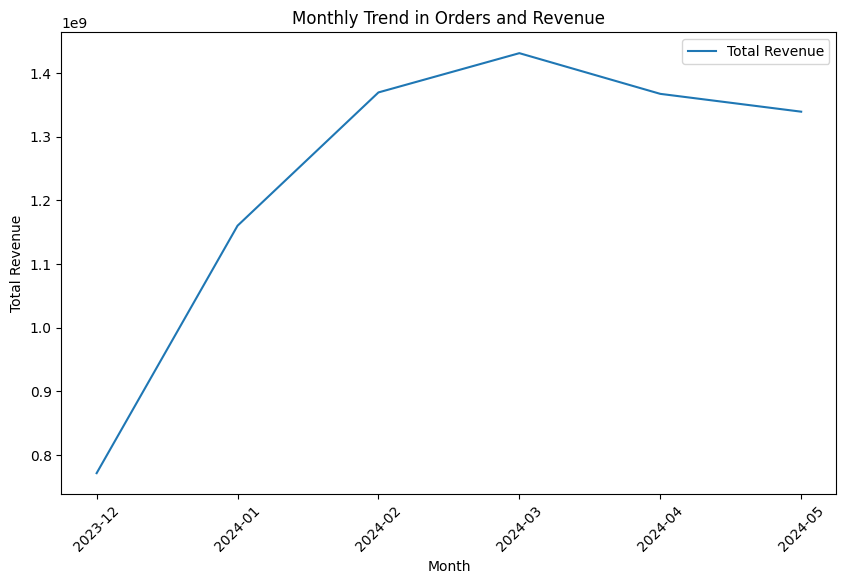

In [136]:


# Convert ORDER_DATE to datetime if it is not already
df_Repeated_Orders_unique_saved['ORDER_DATE'] = pd.to_datetime(df_Repeated_Orders_unique_saved['ORDER_DATE'])

# Aggregate data by month or any other time period (e.g., weekly, daily)
df_monthly_orders = df_Repeated_Orders_unique_saved.groupby(df_Repeated_Orders_unique_saved['ORDER_DATE'].dt.to_period('M')).agg({
    'ORDER_ID_RO_IN_WINDOW': 'count',
    'total_revenue': 'sum'
}).reset_index()

# Plotting the trends
plt.figure(figsize=(10, 6))
plt.plot(df_monthly_orders['ORDER_DATE'].astype(str), df_monthly_orders['total_revenue'], label='Total Revenue')
plt.xlabel('Month')
plt.ylabel('Total Revenue')
plt.title('Monthly Trend in Orders and Revenue')
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [137]:
df_monthly_orders

,ORDER_DATE,ORDER_ID_RO_IN_WINDOW,total_revenue
0,2023-12,213041,7.711819e+08
1,2024-01,104216,1.160177e+09
2,2024-02,98026,1.369694e+09
3,2024-03,98142,1.431405e+09
4,2024-04,97984,1.367449e+09
5,2024-05,97211,1.339418e+09


In [138]:
df_monthly_orders_dataframe = pd.DataFrame(df_monthly_orders)
print(df_monthly_orders_dataframe)

  ORDER_DATE  ORDER_ID_RO_IN_WINDOW  total_revenue
0    2023-12                 213041   7.711819e+08
1    2024-01                 104216   1.160177e+09
2    2024-02                  98026   1.369694e+09
3    2024-03                  98142   1.431405e+09
4    2024-04                  97984   1.367449e+09
5    2024-05                  97211   1.339418e+09


In [139]:
df_monthly_orders_dataframe= df_monthly_orders_dataframe.rename(columns={'ORDER_DATE': 'Months'})

In [140]:
df_monthly_orders_dataframe = df_monthly_orders_dataframe[['Months', 'total_revenue']]
df_monthly_orders_dataframe

,Months,total_revenue
0,2023-12,7.711819e+08
1,2024-01,1.160177e+09
2,2024-02,1.369694e+09
3,2024-03,1.431405e+09
4,2024-04,1.367449e+09
5,2024-05,1.339418e+09


In [141]:
df_Repeated_Orders_trend = df_Repeated_Orders_unique_saved.groupby(df_Repeated_Orders_unique_saved['ORDER_DATE']).agg({
    'total_revenue': 'sum'
}).reset_index()

In [142]:
df_Repeated_Orders_trend

,ORDER_DATE,total_revenue
0,2023-12-01 00:43:50.417000+00:00,3475.65
1,2023-12-01 00:48:04.433000+00:00,1361.28
2,2023-12-01 01:05:56.070000+00:00,3551.74
3,2023-12-01 01:07:05.982000+00:00,530.42
4,2023-12-01 01:12:59.590000+00:00,4073.26
...,...,...
708557,2024-05-30 20:56:12.775000+00:00,1777.06
708558,2024-05-30 21:27:36.280000+00:00,4272.62
708559,2024-05-30 21:32:19.506000+00:00,2045.72
708560,2024-05-30 21:53:47.897000+00:00,2667.47


In [143]:
df_Repeated_Orders_unique_saved.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708620 entries, 0 to 708619
Data columns (total 30 columns):
 #   Column                         Non-Null Count   Dtype              
---  ------                         --------------   -----              
 0   ORDER_ID_RO_IN_WINDOW          708620 non-null  object             
 1   CUSTOMER_ID                    708620 non-null  int64              
 2   REG_DATE_CUSTOMERS             708620 non-null  datetime64[ns, UTC]
 3   ORDER_DATE                     708620 non-null  datetime64[ns, UTC]
 4   VEHICLE_ID                     708620 non-null  int64              
 5   VEHICLE_TYPE                   708620 non-null  object             
 6   GEO_REGION_ID                  708620 non-null  float64            
 7   GEO_REGION_CITY                708620 non-null  object             
 8   MARKET_TYPE                    708620 non-null  object             
 9   CUSTOMER_FARE                  708620 non-null  float64            
 10  ADID    

In [144]:
df_Repeated_Orders_trend['Date'] = df_Repeated_Orders_trend['ORDER_DATE'].dt.strftime('%Y-%m-%d')
df_Repeated_Orders_trend = df_Repeated_Orders_trend[['Date', 'total_revenue']]
df_Repeated_Orders_trend
# 708620

,Date,total_revenue
0,2023-12-01,3475.65
1,2023-12-01,1361.28
2,2023-12-01,3551.74
3,2023-12-01,530.42
4,2023-12-01,4073.26
...,...,...
708557,2024-05-30,1777.06
708558,2024-05-30,4272.62
708559,2024-05-30,2045.72
708560,2024-05-30,2667.47


In [145]:
df_Repeated_Orders_trend = df_Repeated_Orders_trend.groupby('Date')['total_revenue'].sum()
df_Repeated_Orders_trend

,total_revenue
Date,
2023-12-01,6439986.09
2023-12-02,9480567.91
2023-12-03,7683181.61
2023-12-04,8420819.14
2023-12-05,10043229.09
...,...
2024-05-26,19676398.78
2024-05-27,45235721.69
2024-05-28,46914781.21


In [146]:
df_Repeated_Orders_trend=df_Repeated_Orders_trend.reset_index()
df_Repeated_Orders_trend

,Date,total_revenue
0,2023-12-01,6439986.09
1,2023-12-02,9480567.91
2,2023-12-03,7683181.61
3,2023-12-04,8420819.14
4,2023-12-05,10043229.09
...,...,...
177,2024-05-26,19676398.78
178,2024-05-27,45235721.69
179,2024-05-28,46914781.21
180,2024-05-29,49339660.66


In [147]:
df_Repeated_Orders_trend.head(11)

,Date,total_revenue
0,2023-12-01,6439986.09
1,2023-12-02,9480567.91
2,2023-12-03,7683181.61
3,2023-12-04,8420819.14
4,2023-12-05,10043229.09
5,2023-12-06,13833619.06
6,2023-12-07,17705935.28
7,2023-12-08,22466389.85
8,2023-12-09,22569463.01
9,2023-12-10,10267617.94


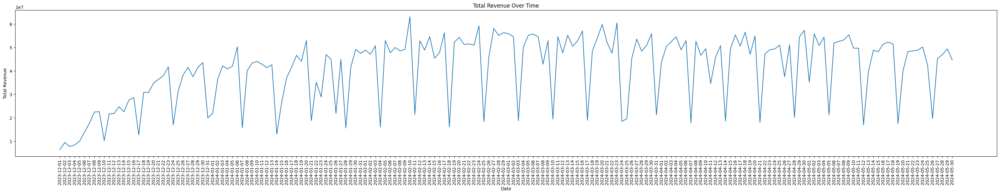

In [148]:
plt.figure(figsize=(40, 6))
plt.plot(df_Repeated_Orders_trend['Date'], df_Repeated_Orders_trend['total_revenue'])
plt.xlabel('Date')
plt.ylabel('Total Revenue')
plt.title('Total Revenue Over Time')
# Rotate x-axis labels
plt.xticks(rotation=90)
plt.show()

In [149]:
df_Repeated_Orders_trend

,Date,total_revenue
0,2023-12-01,6439986.09
1,2023-12-02,9480567.91
2,2023-12-03,7683181.61
3,2023-12-04,8420819.14
4,2023-12-05,10043229.09
...,...,...
177,2024-05-26,19676398.78
178,2024-05-27,45235721.69
179,2024-05-28,46914781.21
180,2024-05-29,49339660.66


In [150]:
df = df_Repeated_Orders_trend.reset_index()
df

,index,Date,total_revenue
0,0,2023-12-01,6439986.09
1,1,2023-12-02,9480567.91
2,2,2023-12-03,7683181.61
3,3,2023-12-04,8420819.14
4,4,2023-12-05,10043229.09
...,...,...,...
177,177,2024-05-26,19676398.78
178,178,2024-05-27,45235721.69
179,179,2024-05-28,46914781.21
180,180,2024-05-29,49339660.66


In [151]:
import pandas as pd

# Assuming your DataFrame is named 'df'
# Convert 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

# Resample to weekly frequency (W-SUN = weeks ending on Sunday)
weekly_df = df.resample('W-SUN', on='Date')['total_revenue'].sum().reset_index()

# Rename columns for clarity
weekly_df.columns = ['Week_Ending', 'Total_Revenue']

# Convert 'Total_Revenue' to integer type
weekly_df['Total_Revenue'] = weekly_df['Total_Revenue'].astype(int)

# Ensure 'Week_Ending' remains in datetime format
weekly_df['Week_Ending'] = pd.to_datetime(weekly_df['Week_Ending'])

# Show results
print(weekly_df)

   Week_Ending  Total_Revenue
0   2023-12-03       23603735
1   2023-12-10      105307073
2   2023-12-17      159454363
3   2023-12-24      229334384
4   2023-12-31      253482341
5   2024-01-07      249037988
6   2024-01-14      267129689
7   2024-01-21      267643213
8   2024-01-28      238284074
9   2024-02-04      300709013
10  2024-02-11      332608704
11  2024-02-18      321736085
12  2024-02-25      337521336
13  2024-03-03      344301596
14  2024-03-10      330478246
15  2024-03-17      336563128
16  2024-03-24      340618011
17  2024-03-31      294645888
18  2024-04-07      320493535
19  2024-04-14      298454206
20  2024-04-21      331602620
21  2024-04-28      305161601
22  2024-05-05      328891910
23  2024-05-12      329174636
24  2024-05-19      309246696
25  2024-05-26      297696649
26  2024-06-02      186144447


In [152]:
weekly_df=weekly_df.iloc[1:-1]

weekly_df

,Week_Ending,Total_Revenue
1,2023-12-10,105307073
2,2023-12-17,159454363
3,2023-12-24,229334384
4,2023-12-31,253482341
5,2024-01-07,249037988
6,2024-01-14,267129689
7,2024-01-21,267643213
8,2024-01-28,238284074
9,2024-02-04,300709013
10,2024-02-11,332608704


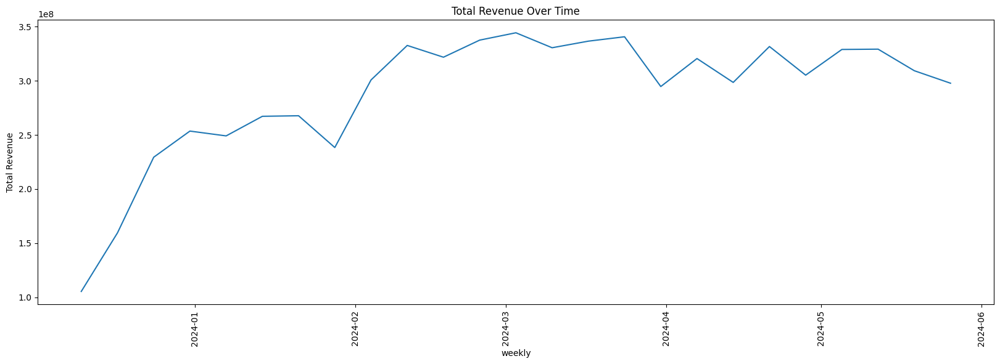

In [153]:
plt.figure(figsize=(20, 6))
plt.plot(weekly_df['Week_Ending'], weekly_df['Total_Revenue'])
plt.xlabel('weekly')
plt.ylabel('Total Revenue')
plt.title('Total Revenue Over Time')
# Rotate x-axis labels
plt.xticks(rotation=90)
plt.show()

In [154]:
df=weekly_df
df

,Week_Ending,Total_Revenue
1,2023-12-10,105307073
2,2023-12-17,159454363
3,2023-12-24,229334384
4,2023-12-31,253482341
5,2024-01-07,249037988
6,2024-01-14,267129689
7,2024-01-21,267643213
8,2024-01-28,238284074
9,2024-02-04,300709013
10,2024-02-11,332608704


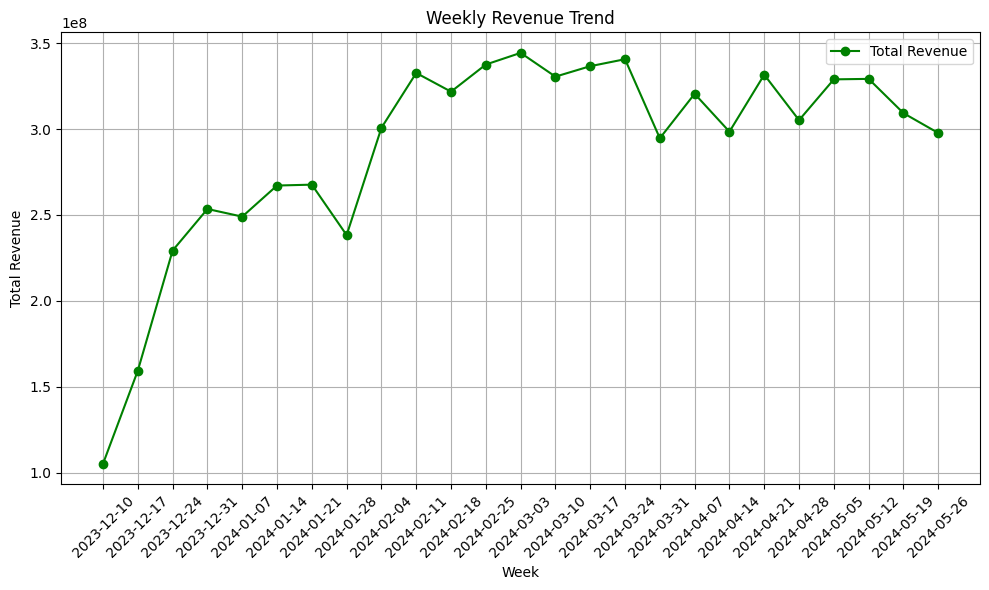

In [155]:
# Plotting the weekly revenue trend
plt.figure(figsize=(10, 6))
plt.plot(df['Week_Ending'].astype(str), df['Total_Revenue'], marker='o', linestyle='-', color='g', label='Total Revenue')
plt.xlabel('Week')
plt.ylabel('Total Revenue')
plt.title('Weekly Revenue Trend')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [156]:
df['Week_Ending'] = pd.to_datetime(df['Week_Ending'])


In [157]:
df['Week_Ending'].dtype

dtype('<M8[ns]')

In [158]:
! pip install statsmodels

Training data:
1     105307073
2     159454363
3     229334384
4     253482341
5     249037988
6     267129689
7     267643213
8     238284074
9     300709013
10    332608704
11    321736085
12    337521336
13    344301596
14    330478246
15    336563128
16    340618011
17    294645888
18    320493535
19    298454206
Name: Total_Revenue, dtype: int64

Testing data:
20    331602620
21    305161601
22    328891910
23    329174636
24    309246696
25    297696649
Name: Total_Revenue, dtype: int64
Additive Model RMSE: 29678179.0720
Additive Model MAE: 24234232.0908
Multiplicative Model RMSE: 30423092.9721
Multiplicative Model MAE: 25123188.8939
Using Additive model for forecasting


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency W-SUN will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



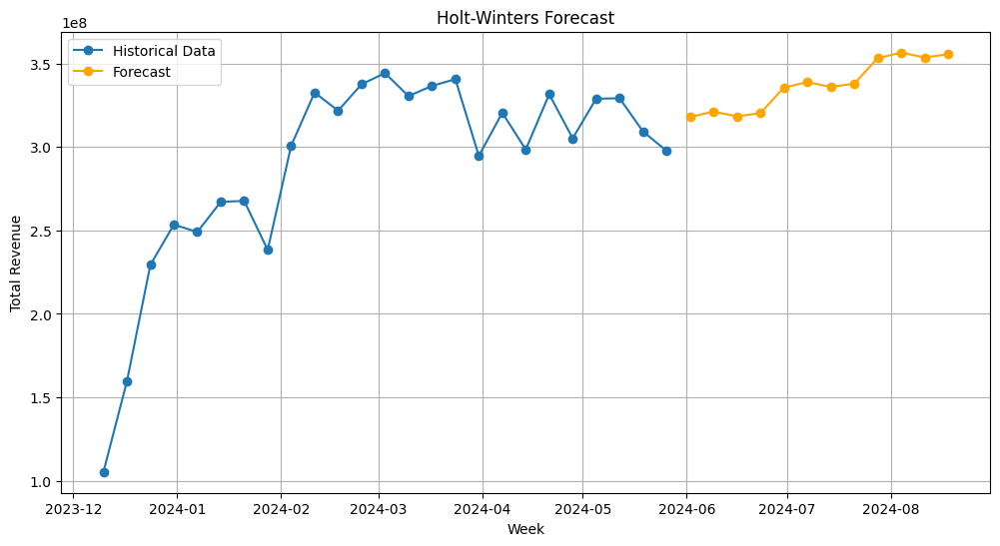

Forecasted Values:
            Total_Revenue
2024-06-02   3.179191e+08
2024-06-09   3.212176e+08
2024-06-16   3.183409e+08
2024-06-23   3.202432e+08
2024-06-30   3.355712e+08
2024-07-07   3.388697e+08
2024-07-14   3.359930e+08
2024-07-21   3.378953e+08
2024-07-28   3.532233e+08
2024-08-04   3.565218e+08
2024-08-11   3.536452e+08
2024-08-18   3.555474e+08


In [159]:
!pip install statsmodels
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming 'df' is the DataFrame with your data
# Split the data into training and test sets (last 6 weeks as the test set)
split_point = len(df) - 6

# Split the data
train = df['Total_Revenue'][:split_point]  # First 80% for training
test = df['Total_Revenue'][split_point:]   # Remaining 20% for testing
# Print the results
print("Training data:")
print(train)
print("\nTesting data:")
print(test)

# Set a smaller seasonal_periods value (e.g., 4 for quarterly data, or a value less than len(train) // 2)
seasonal_periods = 4  # Example: Quarterly seasonality

# Check if seasonal_periods is valid based on the length of the training data
if seasonal_periods > len(train) // 2:
    seasonal_periods = len(train) // 2  # Limit seasonal_periods to half the training data length
    print(f"Seasonal periods adjusted to {seasonal_periods} due to insufficient training data.")

# Fit the Additive Holt-Winters model
additive_model = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=seasonal_periods).fit()
additive_forecast = additive_model.forecast(len(test))

# Fit the Multiplicative Holt-Winters model
multiplicative_model = ExponentialSmoothing(train, trend='add', seasonal='mul', seasonal_periods=seasonal_periods).fit()
multiplicative_forecast = multiplicative_model.forecast(len(test))

# Calculate RMSE and MAE for the Additive model
additive_rmse = np.sqrt(mean_squared_error(test, additive_forecast))
additive_mae = mean_absolute_error(test, additive_forecast)

# Calculate RMSE and MAE for the Multiplicative model
multiplicative_rmse = np.sqrt(mean_squared_error(test, multiplicative_forecast))
multiplicative_mae = mean_absolute_error(test, multiplicative_forecast)

# Print the results
print(f"Additive Model RMSE: {additive_rmse:.4f}")
print(f"Additive Model MAE: {additive_mae:.4f}")
print(f"Multiplicative Model RMSE: {multiplicative_rmse:.4f}")
print(f"Multiplicative Model MAE: {multiplicative_mae:.4f}")

# Automatically select the better model based on RMSE and MAE
if additive_rmse < multiplicative_rmse and additive_mae < multiplicative_mae:
    print("Using Additive model for forecasting")
    selected_trend = 'add'
    selected_seasonal = 'add'
else:
    print("Using Multiplicative model for forecasting")
    selected_trend = 'add'
    selected_seasonal = 'mul'

# Convert the 'Week_Ending' column to datetime with the correct format if it's not already datetime
# df['Week_Ending'] = pd.to_datetime(df['Week_Ending']) # No need to convert if it's already datetime

# Reset the index to bring 'Week_Ending' back as a column
df = df.reset_index()

# Convert to datetime if not already
df['Week_Ending'] = pd.to_datetime(df['Week_Ending'])

# Set 'Week_Ending' as the index
df.set_index('Week_Ending', inplace=True)

# Step 1: Fit the selected Holt-Winters model
model = ExponentialSmoothing(
    df['Total_Revenue'],
    trend=selected_trend,           # Selected trend
    seasonal=selected_seasonal,     # Selected seasonality
    seasonal_periods=seasonal_periods            # 12 months in a year
).fit()

# Step 2: Forecast the next 12 weeks (adjust if needed)
forecast = model.forecast(steps=12)

# Step 3: Create a new DataFrame to store results
forecast_index = pd.date_range(start=df.index[-1] + pd.DateOffset(weeks=1), periods=12, freq='W-SUN')
forecast_df = pd.DataFrame({'Total_Revenue': forecast}, index=forecast_index)

# Step 4: Plot original data and forecast
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Total_Revenue'], label='Historical Data', marker='o')
plt.plot(forecast_df.index, forecast_df['Total_Revenue'], label='Forecast', marker='o', color='orange')
plt.title('Holt-Winters Forecast')
plt.xlabel('Week')  # Changed to 'Week' for weekly data
plt.ylabel('Total Revenue')
plt.legend()
plt.grid()
plt.show()

# Step 5: Display forecasted values
print("Forecasted Values:")
print(forecast_df)

In [160]:
# Step 6: Save historical data and forecast to CSV
# Concatenate historical data and forecast data
combined_df = pd.concat([df, forecast_df])

# Save to CSV
combined_df.to_csv('total_revenue_forecast.csv')
print("Data saved to 'total_revenue_forecast.csv'")

Data saved to 'total_revenue_forecast.csv'


In [161]:
from scipy.stats import zscore

# Compute Z-scores for CUSTOMER_FARE (order value equivalent)
df_Repeated_Orders['Fare_Z_Score'] = zscore(df_Repeated_Orders['CUSTOMER_FARE'])

# Define threshold for anomaly detection (values above 3 are considered outliers)
threshold = 3

# Identify anomalies
anomalies = df_Repeated_Orders[df_Repeated_Orders['Fare_Z_Score'].abs() > threshold]

# Display anomalies
print("Anomalous Orders:")
print(anomalies[['CUSTOMER_ID', 'CUSTOMER_FARE', 'Fare_Z_Score']])


Anomalous Orders:
        CUSTOMER_ID  CUSTOMER_FARE  Fare_Z_Score
4          17833127        1784.08      3.484436
70         17833772        1736.43      3.369997
74         17833841        2656.63      5.580001
105        17834111        1987.73      3.973533
147        17834397        2624.88      5.503748
...             ...            ...           ...
708053     18039769        4618.00     10.290537
708142     17950019        1788.00      3.493850
708200     18088645        1757.00      3.419399
708355     17962326        1832.00      3.599523
708601     17951662        2122.00      4.296003

[11738 rows x 3 columns]


### 🔥 Cohort Analysis and Visualization

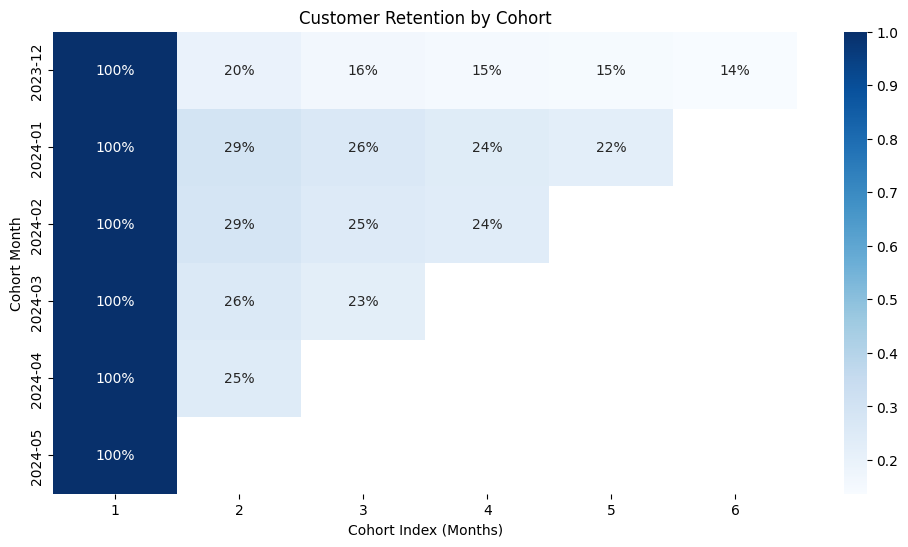

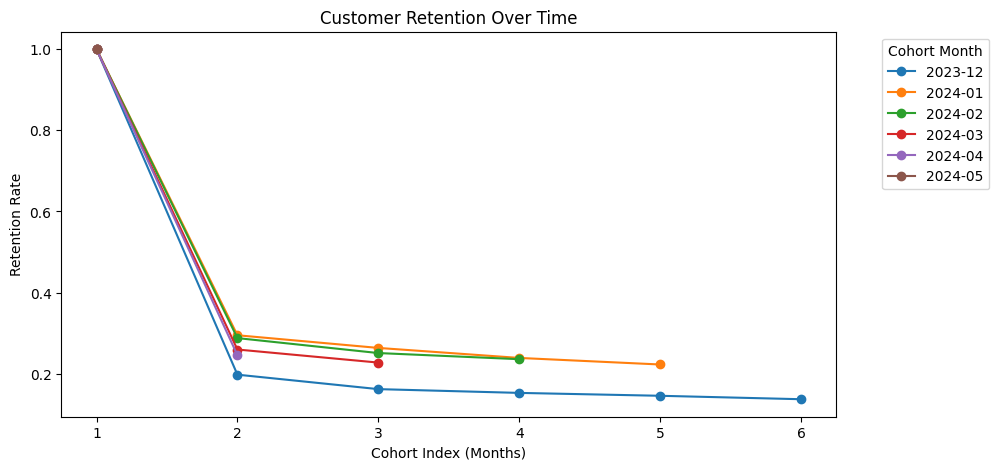

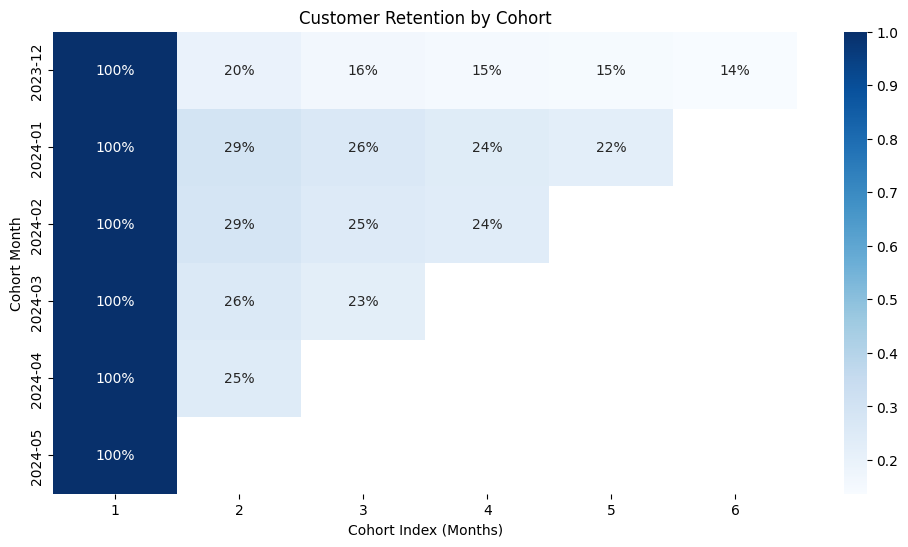

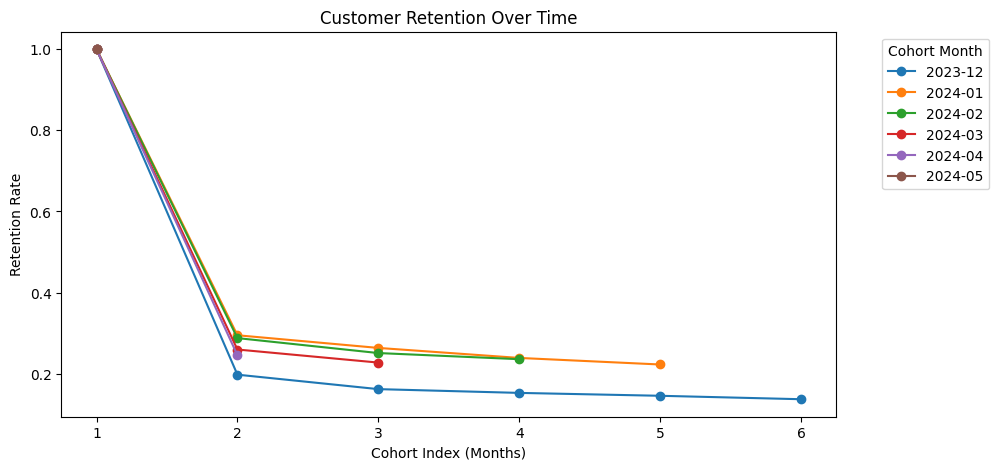

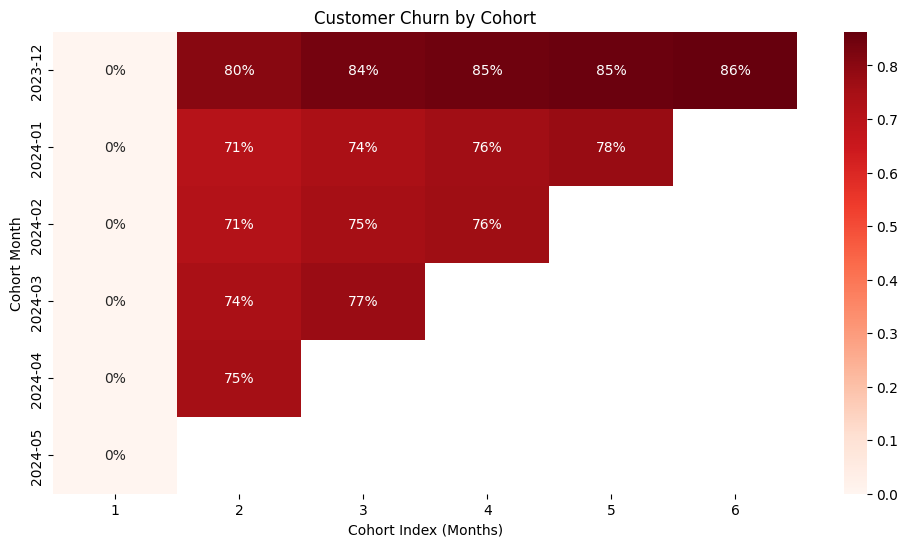

In [162]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset (Assuming df_Repeated_Orders_unique_saved contains 'CUSTOMER_ID' and 'ORDER_DATE')
df = df_Repeated_Orders_unique_saved.copy()

# Convert ORDER_DATE to datetime format
df['ORDER_DATE'] = pd.to_datetime(df['ORDER_DATE'])

# Extract Cohort Month (first purchase month of each customer)
df['Cohort_Month'] = df.groupby('CUSTOMER_ID')['ORDER_DATE'].transform('min').dt.to_period('M')

# Extract Order Year and Month
df['Order_Year'] = df['ORDER_DATE'].dt.year
df['Order_Month'] = df['ORDER_DATE'].dt.month

# Create Cohort Index (time difference from first purchase)
df['Cohort_Index'] = (df['Order_Year'] - df['Cohort_Month'].dt.year) * 12 + (df['Order_Month'] - df['Cohort_Month'].dt.month) + 1

# Create Cohort Table (Pivot)
cohort_counts = df.groupby(['Cohort_Month', 'Cohort_Index'])['CUSTOMER_ID'].nunique().unstack()

# Calculate Retention Rates
cohort_sizes = cohort_counts.iloc[:, 0]  # First column (month 1) is the cohort size
retention_matrix = cohort_counts.divide(cohort_sizes, axis=0)

# Calculate Churn Rates (1 - Retention Rate)
churn_matrix = 1 - retention_matrix

# 1️⃣ Heatmap for Retention Trends
plt.figure(figsize=(12, 6))
sns.heatmap(retention_matrix, annot=True, fmt=".0%", cmap="Blues")
plt.title("Customer Retention by Cohort")
plt.ylabel("Cohort Month")
plt.xlabel("Cohort Index (Months)")
plt.show()

# 2️⃣ Line Plot for Retention Rate Trends
plt.figure(figsize=(10, 5))
for index in retention_matrix.index:
    plt.plot(retention_matrix.columns, retention_matrix.loc[index], marker="o", label=str(index))

plt.title("Customer Retention Over Time")
plt.xlabel("Cohort Index (Months)")
plt.ylabel("Retention Rate")
plt.legend(title="Cohort Month", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset (Assuming df_Repeated_Orders_unique_saved contains 'CUSTOMER_ID' and 'ORDER_DATE')
df = df_Repeated_Orders_unique_saved.copy()

# Convert ORDER_DATE to datetime format
df['ORDER_DATE'] = pd.to_datetime(df['ORDER_DATE'])

# Extract Cohort Month (first purchase month of each customer)
df['Cohort_Month'] = df.groupby('CUSTOMER_ID')['ORDER_DATE'].transform('min').dt.to_period('M')

# Extract Order Year and Month
df['Order_Year'] = df['ORDER_DATE'].dt.year
df['Order_Month'] = df['ORDER_DATE'].dt.month

# Create Cohort Index (time difference from first purchase)
df['Cohort_Index'] = (df['Order_Year'] - df['Cohort_Month'].dt.year) * 12 + (df['Order_Month'] - df['Cohort_Month'].dt.month) + 1

# Create Cohort Table (Pivot)
cohort_counts = df.groupby(['Cohort_Month', 'Cohort_Index'])['CUSTOMER_ID'].nunique().unstack()

# Calculate Retention Rates
cohort_sizes = cohort_counts.iloc[:, 0]  # First column (month 1) is the cohort size
retention_matrix = cohort_counts.divide(cohort_sizes, axis=0)

# Calculate Churn Rates (1 - Retention Rate)
churn_matrix = 1 - retention_matrix

# 1️⃣ Heatmap for Retention Trends
plt.figure(figsize=(12, 6))
sns.heatmap(retention_matrix, annot=True, fmt=".0%", cmap="Blues")
plt.title("Customer Retention by Cohort")
plt.ylabel("Cohort Month")
plt.xlabel("Cohort Index (Months)")
plt.show()

# 2️⃣ Line Plot for Retention Rate Trends
plt.figure(figsize=(10, 5))
for index in retention_matrix.index:
    plt.plot(retention_matrix.columns, retention_matrix.loc[index], marker="o", label=str(index))

plt.title("Customer Retention Over Time")
plt.xlabel("Cohort Index (Months)")
plt.ylabel("Retention Rate")
plt.legend(title="Cohort Month", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# 3️⃣ Heatmap for Churn Rates
plt.figure(figsize=(12, 6))
sns.heatmap(churn_matrix, annot=True, fmt=".0%", cmap="Reds") #added cmap
plt.title("Customer Churn by Cohort")
plt.ylabel("Cohort Month")
plt.xlabel("Cohort Index (Months)")
plt.show()

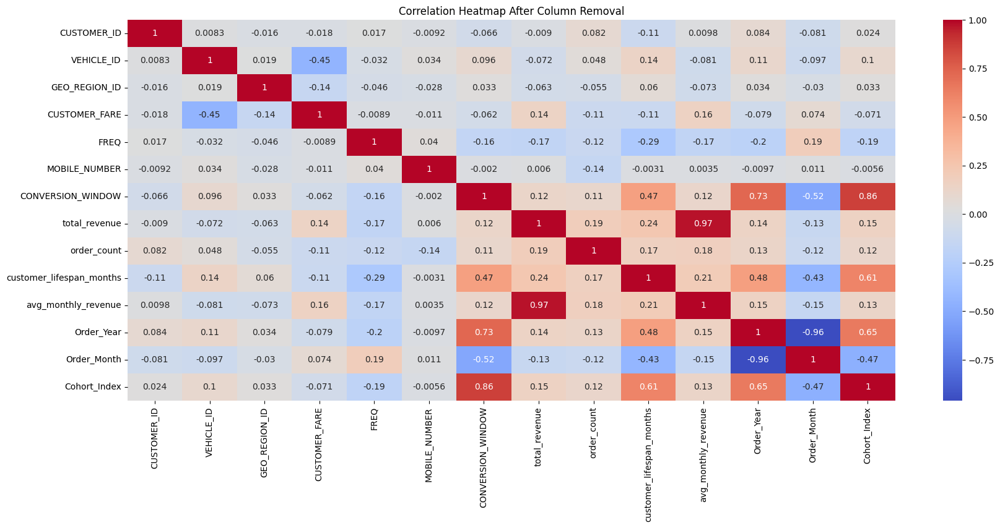

In [163]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np  # Ensure NumPy is imported

# Select only numerical features
numerical_df = df.select_dtypes(include=np.number)

# Drop the unwanted column (replace 'Column_Name' with the actual column name)
numerical_df = numerical_df.drop(columns=['Historical_clv/Predictive_clv'])

# Calculate the correlation matrix
correlation_matrix = numerical_df.corr()

# Plot the heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap After Column Removal')
plt.show()


In [164]:
df

,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,...,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment,Cohort_Month,Order_Year,Order_Month,Cohort_Index
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,...,2024-01-06,2023-12-01,1.0,3475.650000,3475.65,Medium_High,2023-12,2023,12,1
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,...,2023-12-01,2023-12-01,0.0,0.000000,0.00,Low,2023-12,2023,12,1
2,CRN1456514356,17833116,2023-12-01 01:02:22.553000+00:00,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,...,2023-12-08,2023-12-01,0.0,0.000000,0.00,Low,2023-12,2023,12,1
3,CRN1900903855,17833075,2023-12-01 00:34:05.421000+00:00,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,...,2023-12-01,2023-12-01,0.0,0.000000,0.00,Low,2023-12,2023,12,1
4,CRN1615991541,17833127,2023-12-01 01:07:06.978000+00:00,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,...,2024-03-19,2023-12-01,4.0,1018.315000,4073.26,Medium_High,2023-12,2023,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708615,CRN1089676304,18194980,2023-12-18 21:46:22.938000+00:00,2024-05-30 20:56:12.775000+00:00,97,2W,2.0,DEL,Semi Matured,407.00,...,2024-05-30,2023-12-18,5.0,355.412000,1777.06,Medium,2023-12,2024,5,6
708616,CRN1178580600,17852815,2023-12-01 17:11:28.626000+00:00,2024-05-30 21:27:36.280000+00:00,97,2W,5.0,CHN,Semi Matured,196.00,...,2024-05-30,2023-12-01,6.0,712.103333,4272.62,Medium_High,2023-12,2024,5,6
708617,CRN1783197932,18157374,2023-12-16 18:36:53.552000+00:00,2024-05-30 21:32:19.506000+00:00,91,LCV,7.0,JPR,Hyper Growth,643.00,...,2024-05-30,2023-12-16,6.0,340.953333,2045.72,Medium_High,2023-12,2024,5,6
708618,CRN1671189673,18395755,2023-12-29 05:54:04.834000+00:00,2024-05-30 21:53:47.897000+00:00,1,LCV,4.0,HYD,Semi Matured,695.00,...,2024-05-30,2023-12-29,5.0,533.494000,2667.47,Medium_High,2023-12,2024,5,6


In [165]:
import pandas as pd

# Set option to display all columns
pd.set_option('display.max_columns', None)

# Optionally, you can also adjust the number of rows if needed
# pd.set_option('display.max_rows', None)

# Now when you display your DataFrame, it will show all columns


# Display top 5 rows with all columns
df.head()


,ORDER_ID_RO_IN_WINDOW,CUSTOMER_ID,REG_DATE_CUSTOMERS,ORDER_DATE,VEHICLE_ID,VEHICLE_TYPE,GEO_REGION_ID,GEO_REGION_CITY,MARKET_TYPE,CUSTOMER_FARE,ADID,UUID,REG_DATE,FREQ,FREQ_SME_RETAILS,CAMPAIGN_NAME,CITY_NAME_FROM_CAMPAIGN,MOBILE_NUMBER,REG_MONTH_YEAR,ORDER_MONTH_YEAR,CONVERSION_WINDOW,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment,Cohort_Month,Order_Year,Order_Month,Cohort_Index
0,CRN1852411579,17833073,2023-12-01 00:32:14.792000+00:00,2023-12-01 00:43:50.417000+00:00,91,LCV,2.0,DEL,Semi Matured,386.29,7b432768223a9bc91aa39d2e0ad752fe,3d1f7bd7-e61a-4996-adcc-e3aa4ae9431f,2023-12-01T00:32:14.792Z,4,SME,NaN,NaN,9319460904,12-2023,12-2023,0,3475.65,8,2023-12-01,2024-01-06,2023-12-01,1.0,3475.650,3475.65,Medium_High,2023-12,2023,12,1
1,CRN1439293796,17833089,2023-12-01 00:43:57.228000+00:00,2023-12-01 00:48:04.433000+00:00,9,HCV,3.0,BLR,Matured,1361.28,7143c03b4520e8c689e08100e49d2c51,04df0860-232b-4aea-b56c-abac25b555b7,2023-12-01T00:43:57.228Z,4,SME,NaN,NaN,9556041378,12-2023,12-2023,0,1361.28,1,2023-12-01,2023-12-01,2023-12-01,0.0,0.000,0.00,Low,2023-12,2023,12,1
2,CRN1456514356,17833116,2023-12-01 01:02:22.553000+00:00,2023-12-01 01:05:56.070000+00:00,1,LCV,1.0,MUM,Matured,746.17,fb6c4f95fd15c585e3836fbae72b7bc8,e2f7b5fa-1e41-4dd7-91fe-67373a17232c,2023-12-01T01:02:22.553Z,5,Retail,NaN,NaN,7039196004,12-2023,12-2023,0,3551.74,5,2023-12-01,2023-12-08,2023-12-01,0.0,0.000,0.00,Low,2023-12,2023,12,1
3,CRN1900903855,17833075,2023-12-01 00:34:05.421000+00:00,2023-12-01 01:07:05.982000+00:00,91,LCV,3.0,BLR,Matured,530.42,d6021c32a1723e935a90dbdee7e93bfa,0d91cc38-5e21-4f5c-bc10-2dbb25b9e304,2023-12-01T00:34:05.421Z,5,Retail,NaN,NaN,8261859663,12-2023,12-2023,0,530.42,1,2023-12-01,2023-12-01,2023-12-01,0.0,0.000,0.00,Low,2023-12,2023,12,1
4,CRN1615991541,17833127,2023-12-01 01:07:06.978000+00:00,2023-12-01 01:12:59.590000+00:00,91,LCV,2.0,DEL,Semi Matured,1784.08,de988982e28037d9d59984899a620242,aba4e525-f73d-4ed2-9f8a-0efd60c76e20,2023-12-01T01:07:06.978Z,5,Retail,NaN,NaN,9999463969,12-2023,12-2023,0,4073.26,4,2023-12-01,2024-03-19,2023-12-01,4.0,1018.315,4073.26,Medium_High,2023-12,2023,12,1


In [166]:
from scipy.stats import ttest_ind


# Filter data for two campaigns (replace 'CampaignA' and 'CampaignB' with actual campaign names)
campaign_a = df_Repeated_Orders_unique[df_Repeated_Orders_unique['CAMPAIGN_NAME'] == 'porter apk download']['CUSTOMER_FARE']
campaign_b = df_Repeated_Orders_unique[df_Repeated_Orders_unique['CAMPAIGN_NAME'] == 'app for parcel delivery']['CUSTOMER_FARE']

# Perform t-test
t_stat, p_value = ttest_ind(campaign_a, campaign_b)

# Output results
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpret results
if p_value < 0.05:
    print("There is a statistically significant difference between the two campaigns.")
else:
    print("There is no statistically significant difference between the two campaigns.")

T-statistic: 0.3377, P-value: 0.7361
There is no statistically significant difference between the two campaigns.


### 📅 RFM Analysis Dashboard

In [167]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the processed RFM file
rfm = pd.read_csv("rfm.csv")

# 1. Customer Segment Distribution
fig_segment = px.pie(
    rfm,
    names="Segment",
    title="Customer Segment Distribution",
    hole=0.4,
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig_segment.update_traces(textposition='inside', textinfo='percent+label')

# 2. RFM Score Histogram
fig_rfm_score = px.histogram(
    rfm,
    x="RFM_Score",
    nbins=10,
    title="Distribution of RFM Scores",
    color="Segment",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# 3. Recency, Frequency, and Monetary Distributions
fig_rfm_dists = make_subplots(rows=1, cols=3, subplot_titles=("Recency", "Frequency", "Monetary Value"))

fig_rfm_dists.add_trace(go.Box(y=rfm["Recency"], name="Recency", marker_color="red"), row=1, col=1)
fig_rfm_dists.add_trace(go.Box(y=rfm["Frequency"], name="Frequency", marker_color="green"), row=1, col=2)
fig_rfm_dists.add_trace(go.Box(y=rfm["MonetaryValue"], name="Monetary", marker_color="blue"), row=1, col=3)
fig_rfm_dists.update_layout(title_text="RFM Metric Distributions", showlegend=False)

# 4. Segment vs Monetary Value (Bar)
segment_avg_monetary = rfm.groupby("Segment")["MonetaryValue"].mean().sort_values(ascending=False).reset_index()
fig_monetary_bar = px.bar(
    segment_avg_monetary,
    x="Segment",
    y="MonetaryValue",
    title="Average Monetary Value per Segment",
    color="Segment",
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Show all plots
fig_segment.show()
fig_rfm_score.show()
fig_rfm_dists.show()
fig_monetary_bar.show()

In [168]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import plot

# Load your CSV file
rfm = pd.read_csv("rfm.csv")

# 1. Customer Segment Distribution
fig_segment = px.pie(
    rfm,
    names="Segment",
    title="Customer Segment Distribution",
    hole=0.4,
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig_segment.update_traces(textposition='inside', textinfo='percent+label')

# 2. RFM Score Histogram
fig_rfm_score = px.histogram(
    rfm,
    x="RFM_Score",
    nbins=10,
    title="Distribution of RFM Scores",
    color="Segment",
    color_discrete_sequence=px.colors.qualitative.Set3
)

# 3. Recency, Frequency, and Monetary Distributions
fig_rfm_dists = make_subplots(rows=1, cols=3, subplot_titles=("Recency", "Frequency", "Monetary Value"))
fig_rfm_dists.add_trace(go.Box(y=rfm["Recency"], name="Recency", marker_color="red"), row=1, col=1)
fig_rfm_dists.add_trace(go.Box(y=rfm["Frequency"], name="Frequency", marker_color="green"), row=1, col=2)
fig_rfm_dists.add_trace(go.Box(y=rfm["MonetaryValue"], name="Monetary", marker_color="blue"), row=1, col=3)
fig_rfm_dists.update_layout(title_text="RFM Metric Distributions", showlegend=False)

# 4. Segment vs Monetary Value (Bar)
segment_avg_monetary = rfm.groupby("Segment")["MonetaryValue"].mean().sort_values(ascending=False).reset_index()
fig_monetary_bar = px.bar(
    segment_avg_monetary,
    x="Segment",
    y="MonetaryValue",
    title="Average Monetary Value per Segment",
    color="Segment",
    color_discrete_sequence=px.colors.qualitative.Pastel
)

# Combine into one HTML file
html_all = "<html><head><title>RFM Dashboard</title><script src='https://cdn.plot.ly/plotly-latest.min.js'></script></head><body>"
html_all += "<h1 style='text-align:center'>RFM Analysis Dashboard</h1>"

for fig in [fig_segment, fig_rfm_score, fig_rfm_dists, fig_monetary_bar]:
    inner_html = plot(fig, include_plotlyjs=False, output_type='div')
    html_all += inner_html + "<hr>"

html_all += "</body></html>"

# Save it
with open("rfm_dashboard.html", "w", encoding="utf-8") as f:
    f.write(html_all)


In [169]:
rfm

,CUSTOMER_ID,Recency,Frequency,MonetaryValue,Recency_Score,Frequency_Score,Monetary_Score,RFM_Score,Segment
0,16772155,540,1,104.92,1,1,1,3,At Risk
1,16785502,365,5,1822.00,4,3,4,11,Champion
2,16803571,375,5,1260.07,4,3,4,11,Champion
3,16815351,539,1,235.87,1,1,2,4,At Risk
4,16843891,371,7,910.73,4,4,3,11,Champion
...,...,...,...,...,...,...,...,...,...
184828,18453188,451,4,1572.41,3,3,4,10,Champion
184829,18453195,513,1,904.70,3,1,3,7,Loyal Customer
184830,18453221,513,1,362.03,3,1,2,6,Potential Loyalist
184831,18453223,423,4,2712.29,3,3,4,10,Champion


In [170]:
customer_metrics

,CUSTOMER_ID,total_revenue,order_count,first_order_date,last_order_date,reg_date,customer_lifespan_months,avg_monthly_revenue,Historical_clv/Predictive_clv,clv_segment
0,16772155,104.92,1,2023-12-04,2023-12-04,2023-10-10,0.0,0.000000,0.00,Low
1,16785502,1822.00,5,2023-12-08,2024-05-27,2023-10-11,6.0,303.666667,1822.00,Medium
2,16803571,1260.07,5,2024-01-24,2024-05-18,2023-10-12,4.0,315.017500,1260.07,Medium
3,16815351,235.87,1,2023-12-06,2023-12-06,2023-10-12,0.0,0.000000,0.00,Low
4,16843891,910.73,7,2023-12-22,2024-05-22,2023-10-14,5.0,182.146000,910.73,Low_Medium
...,...,...,...,...,...,...,...,...,...,...
184828,18453188,1572.41,4,2024-02-21,2024-03-02,2023-12-31,0.0,0.000000,0.00,Low
184829,18453195,904.70,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184830,18453221,362.03,1,2023-12-31,2023-12-31,2023-12-31,0.0,0.000000,0.00,Low
184831,18453223,2712.29,4,2024-01-01,2024-03-31,2023-12-31,3.0,904.096667,2712.29,Medium_High


Method	Accuracy	Useful For	Correct?

Frequency × MonetaryValue	⭐ Basic	RFM Segmentation	✅ Yes (basic)

avg_monthly_revenue × lifespan_months	⭐⭐ Moderate	Historical / Behavioral CLV	✅ Yes (historical)


Both are correct, but for different purposes:

Use RFM CLV for segmentation and initial clustering.

Use Historical CLV for customer valuation and cohort analysis.